# TEMEL KAVRAMLAR

DEĞİŞKEN TÜRLERİ

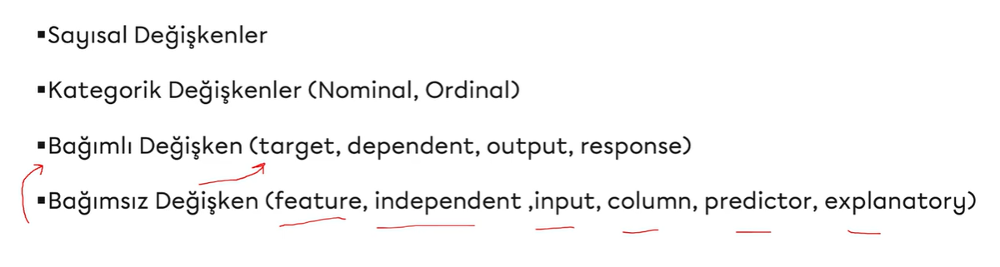

ÖĞRENME TÜRLERİ

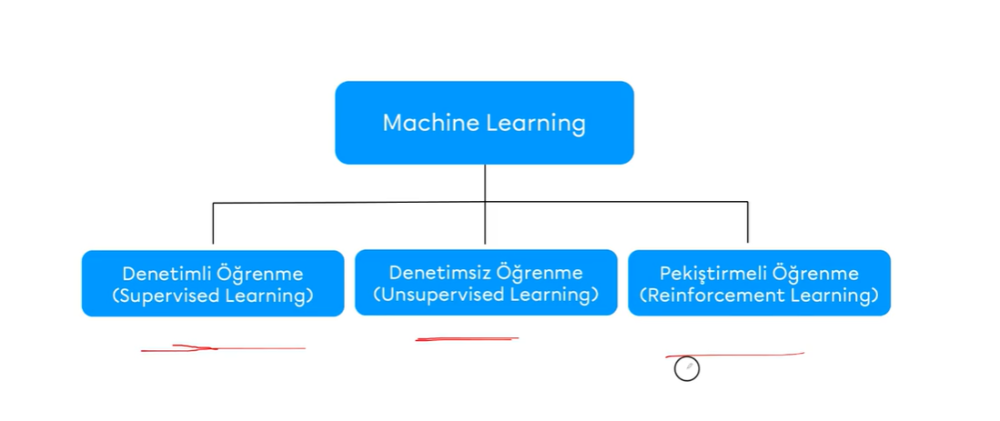

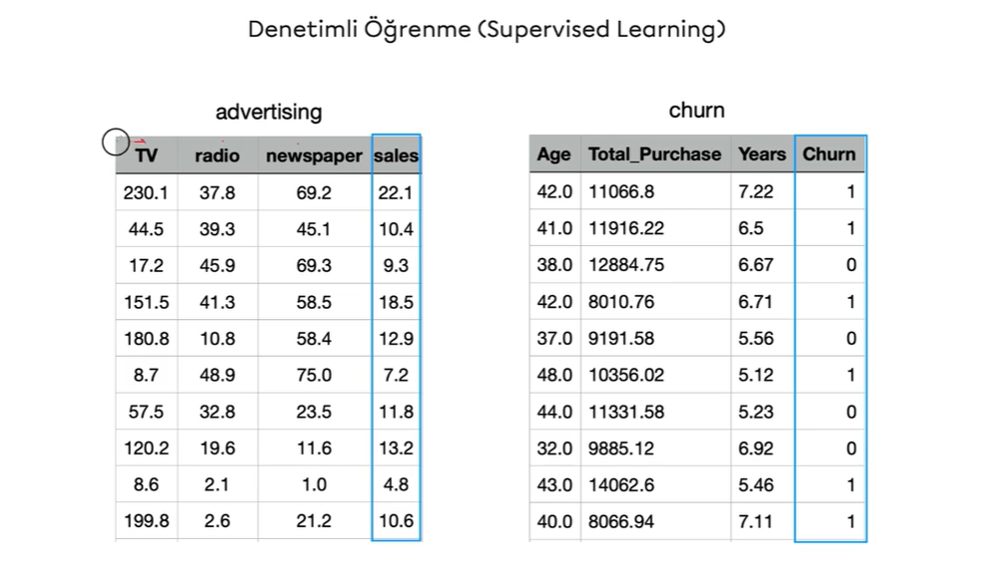

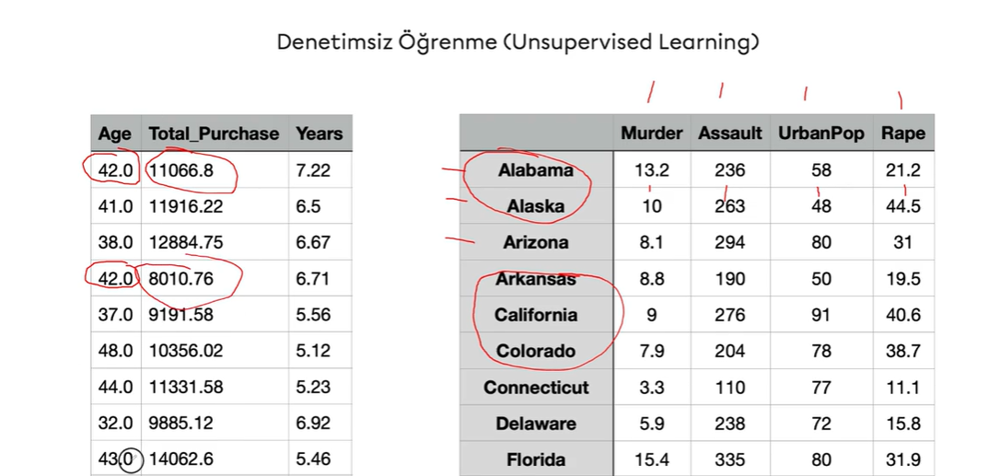

PROBLEM TÜRLERİ

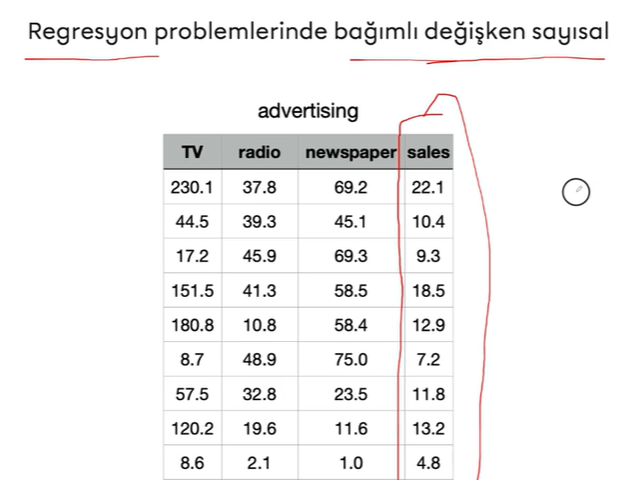

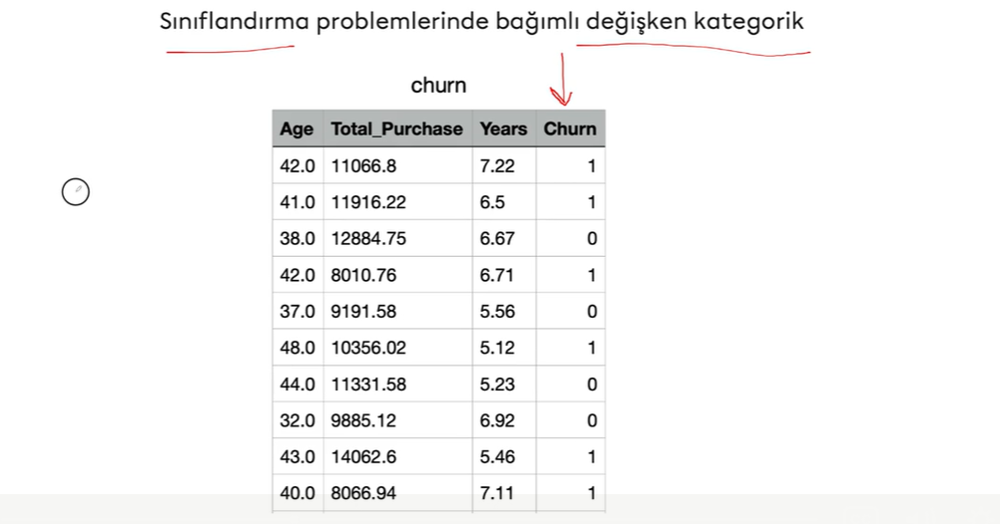

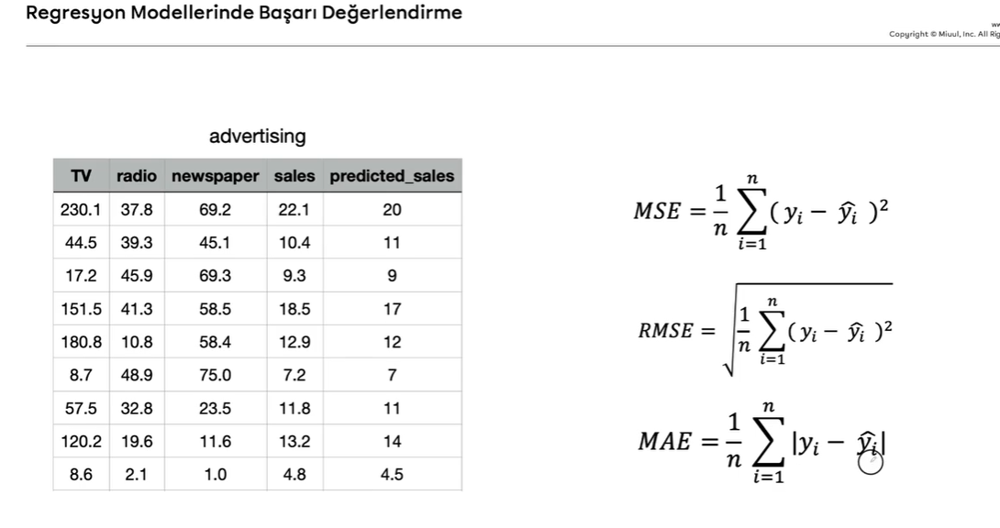

In [ ]:
#optimizasyonda da optimize etmeye çalıştığım bir metriktir. -->MSE (ortalama hata metriğidir.)
#RMSE:hataların farkından sonra kare işleminin kökünü alma
#Mutlak Hata Metriği:MAE

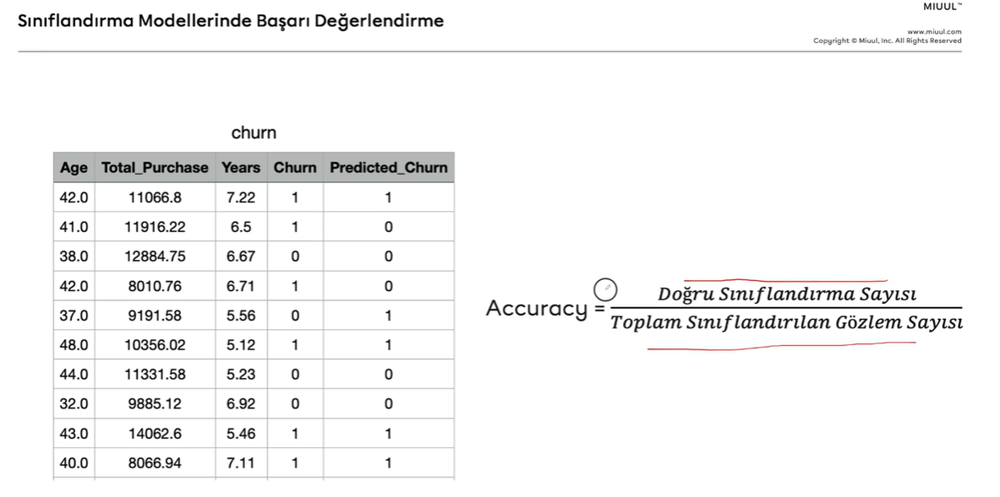

In [ ]:
#MSE ne kadar düşükse o kadar iyi , Accuaracy ne kadar yüksekse o kadar iyidir.

MODEL DOĞRULAMA (VALIDATION) YÖNTEMLERİ

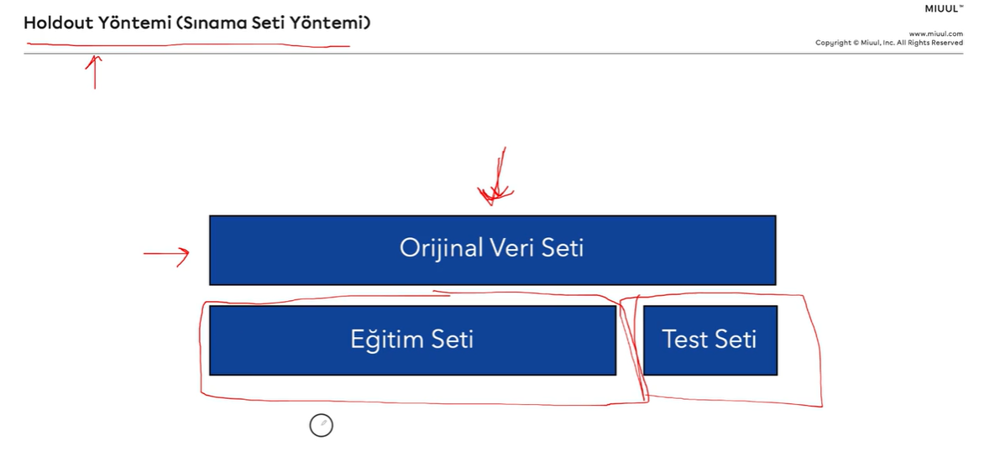

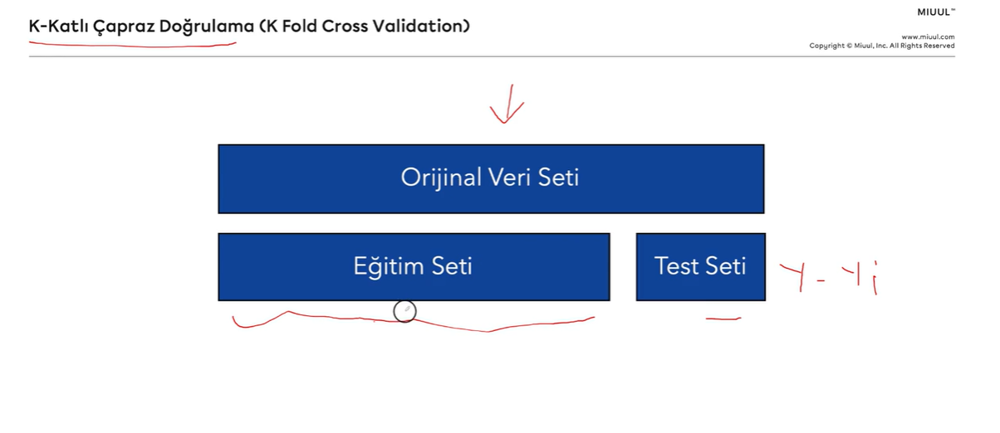

In [ ]:
#Veri stinin boyutundan kaynaklı sıkıntılar doğar -- veri seti boyutu azsa bu tercih edilmez.

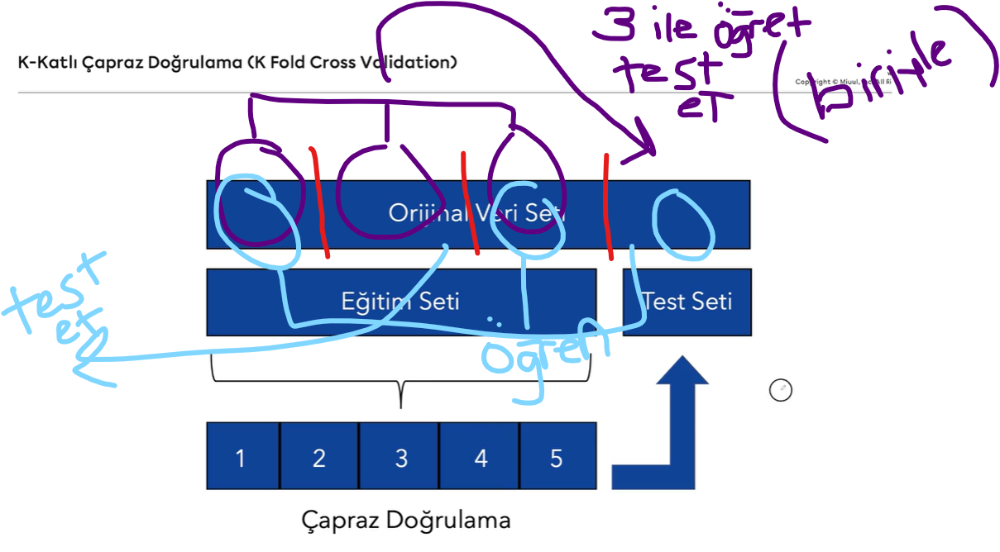

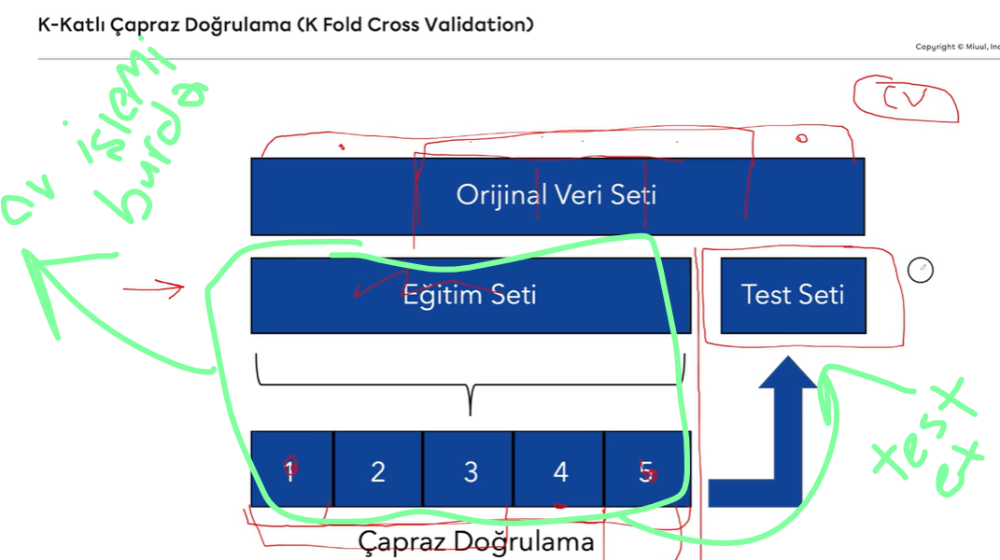

In [ ]:
#veri setini baştan 2 ye bölmek,sonra test setinde test etmek.
#gözlem sayısı az olursa -->

YANLILIK - VARYANS DEĞİŞ TOKUŞU

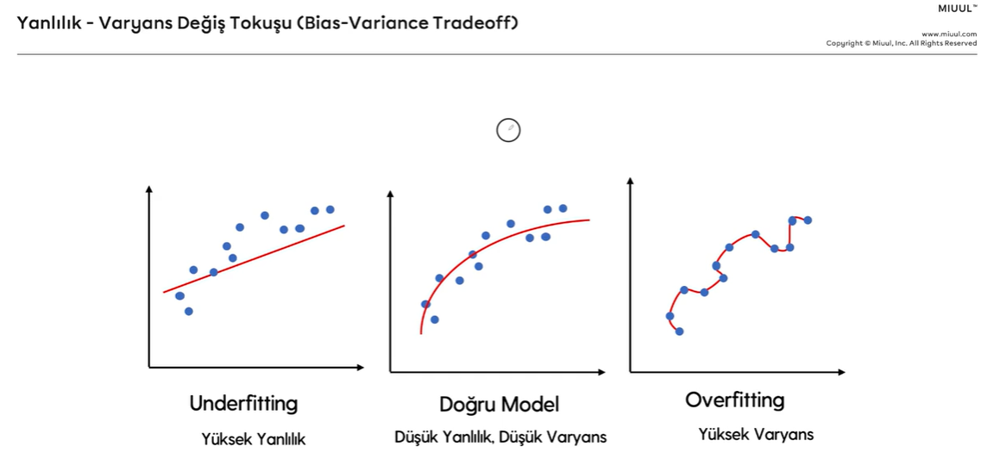

In [ ]:
#overfitting nasıl anlaşılır?  : Hata değişimleri incelenir.Çatallaşmadan itibaren aşırı öğrenme başlar.

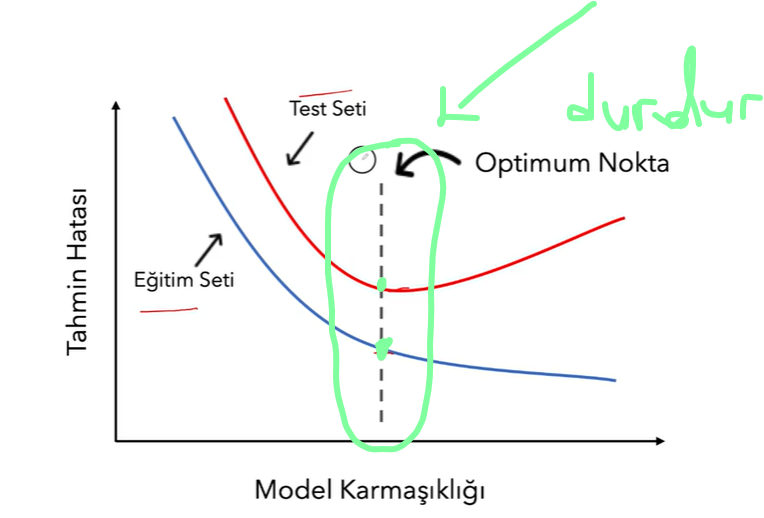

In [ ]:
#Model Karmaşıklığı : doğrusal,ağaç ve sinir modellerinde farklıdı.
#Örnek olarak doğrusal regresyon problaminde : y =b+wx -->+x^2+x^3 verilebilir.Ağaç tabanlı modelerde dallanma sayısı.
#Yani modeli karmaşıklaştırmadır. -->Aslında avantajlıdır bir süreye kadar hatalarımızı düşürür.

# DOĞRUSAL REGRESYON

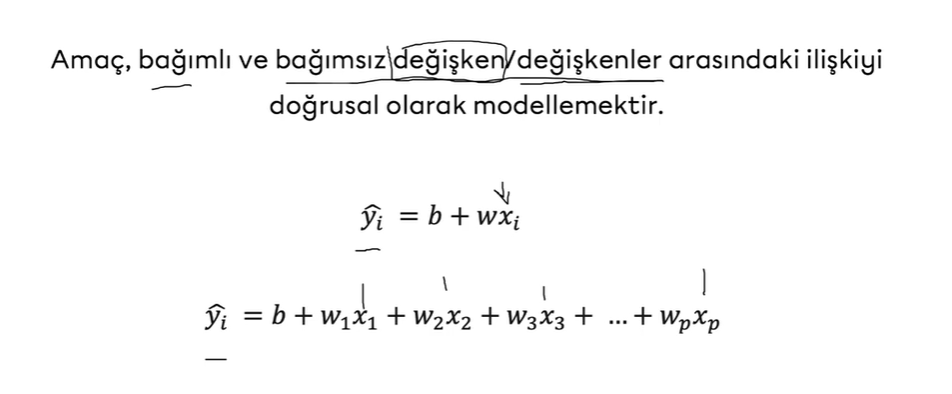

AĞIRLIKLARIN BULUNMASI

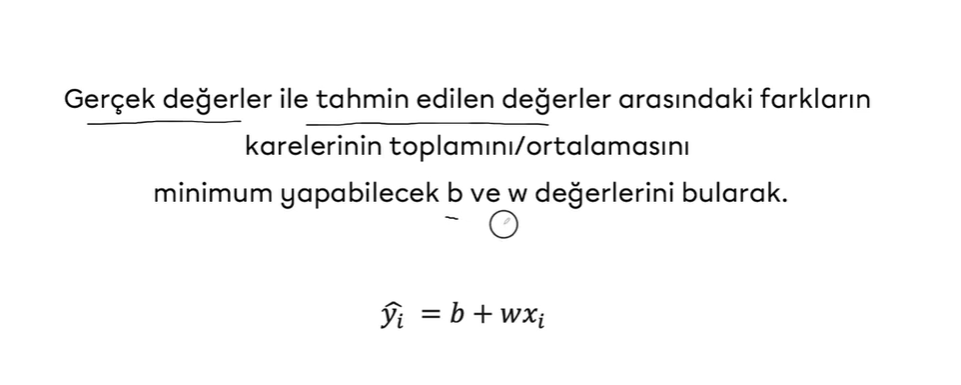

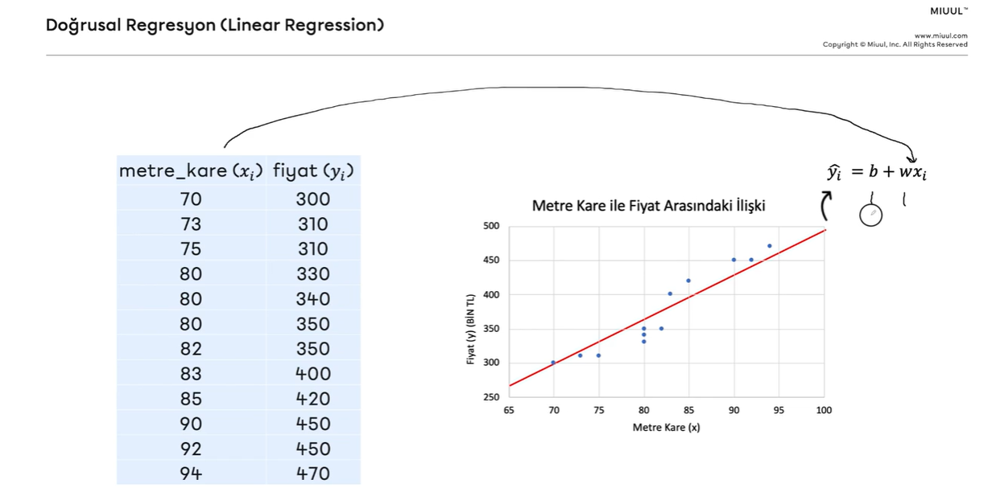

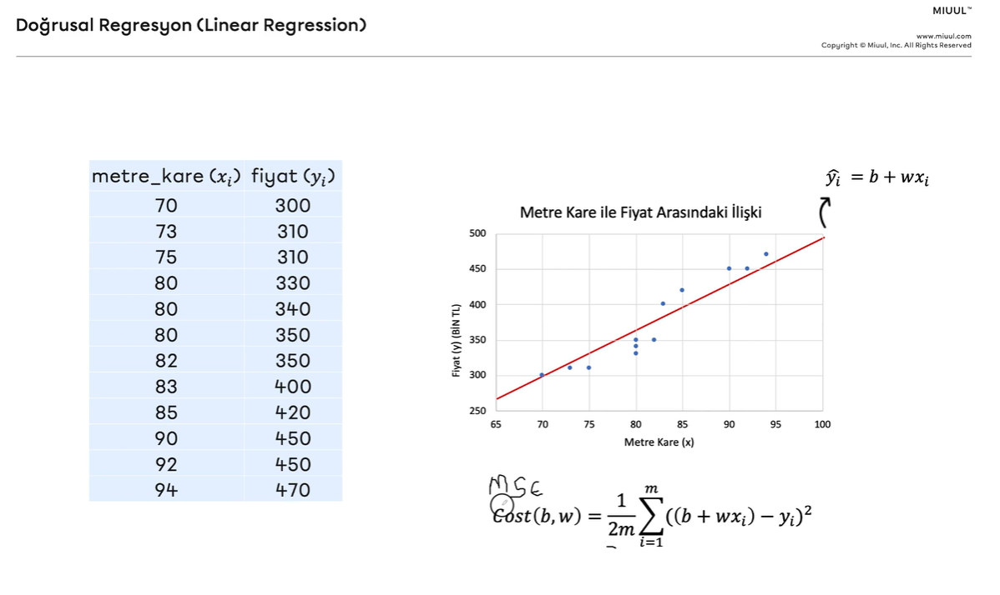

BAŞARI DEĞERLENDİRME YÖNTEMLERİ

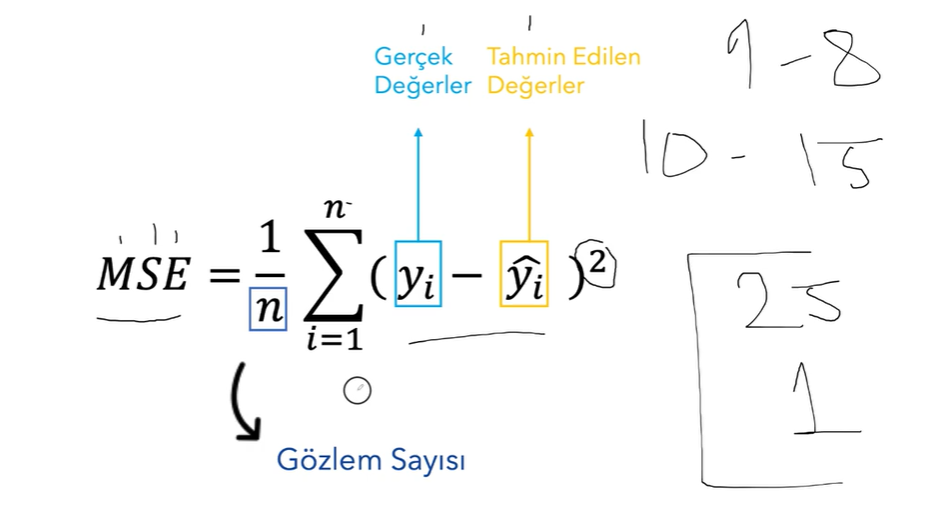

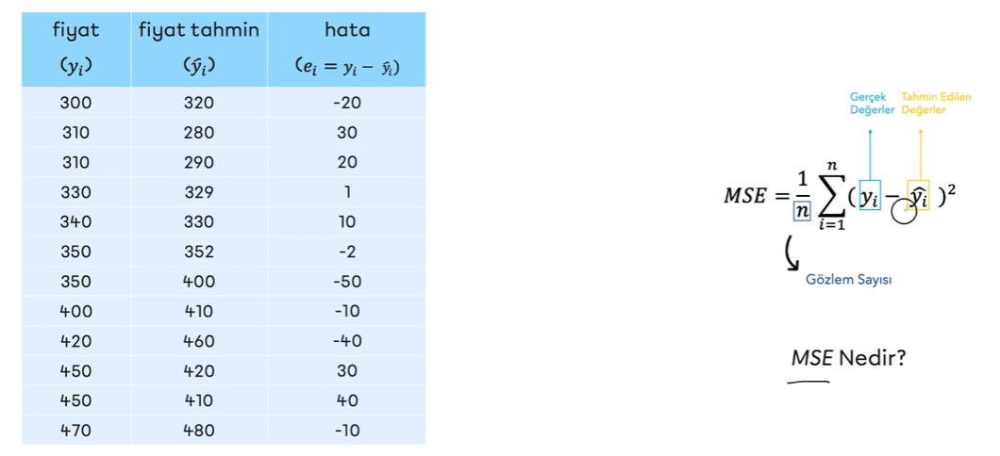

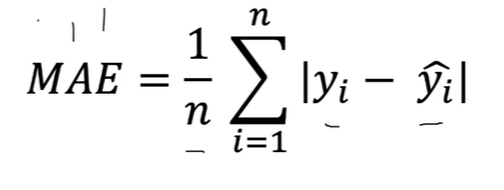

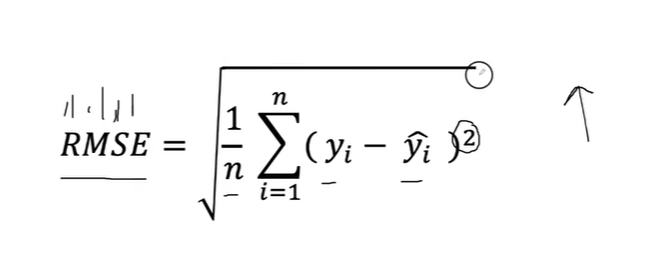

In [ ]:
#Her biri ayrı bir metriktir.Birbirleri arasıbnda kıyaslama yapılmaz.Biri seçilir.

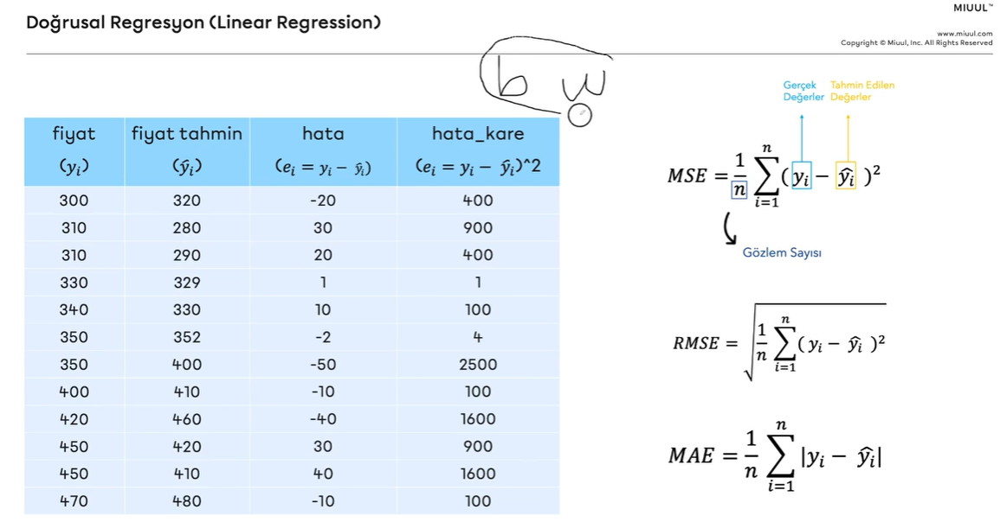

PARAMETRELERİN TAHMİN EDİLMESİ

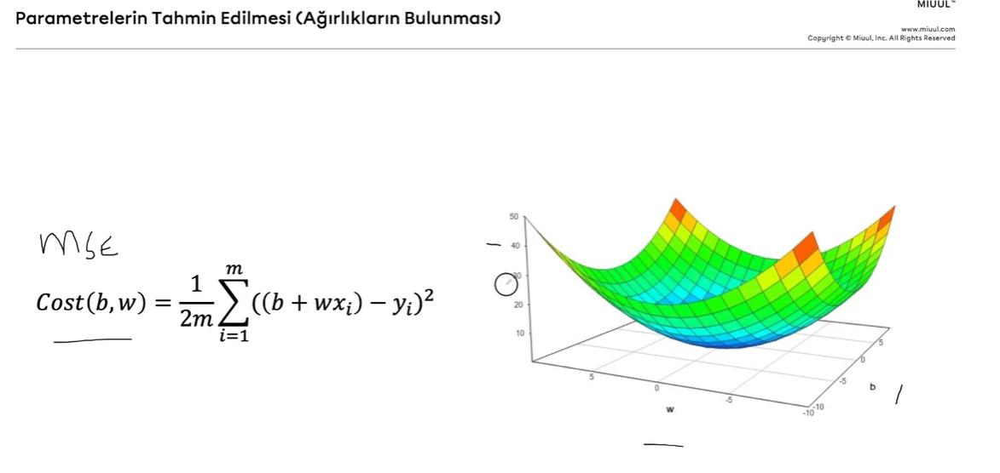

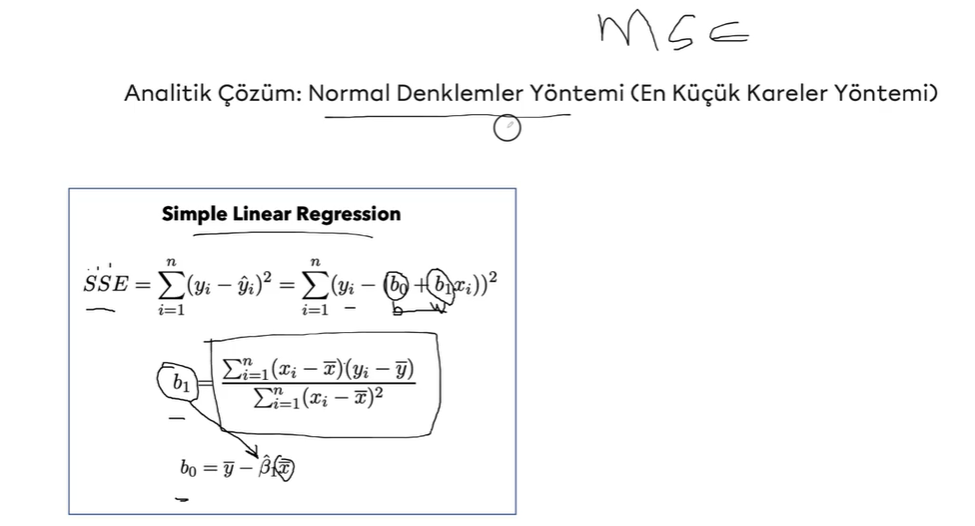

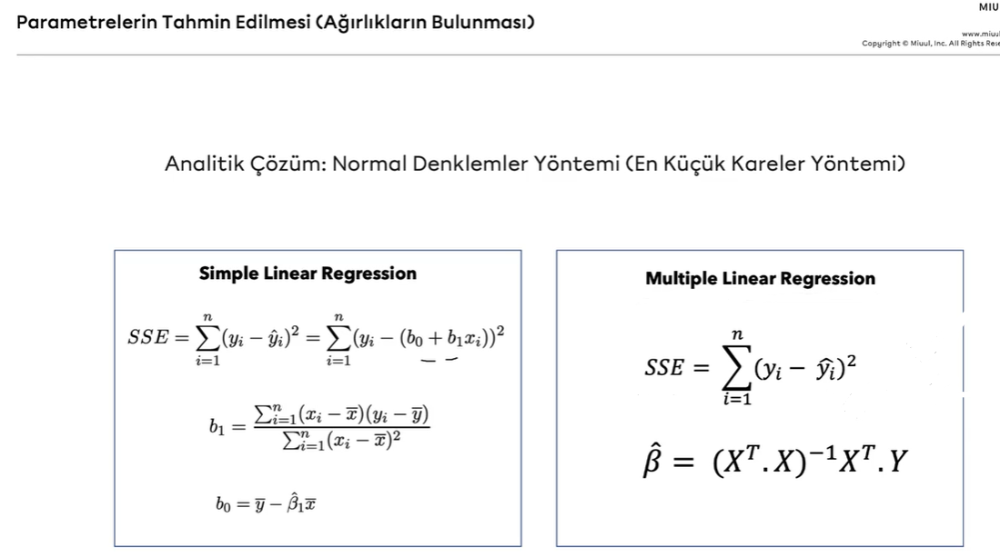

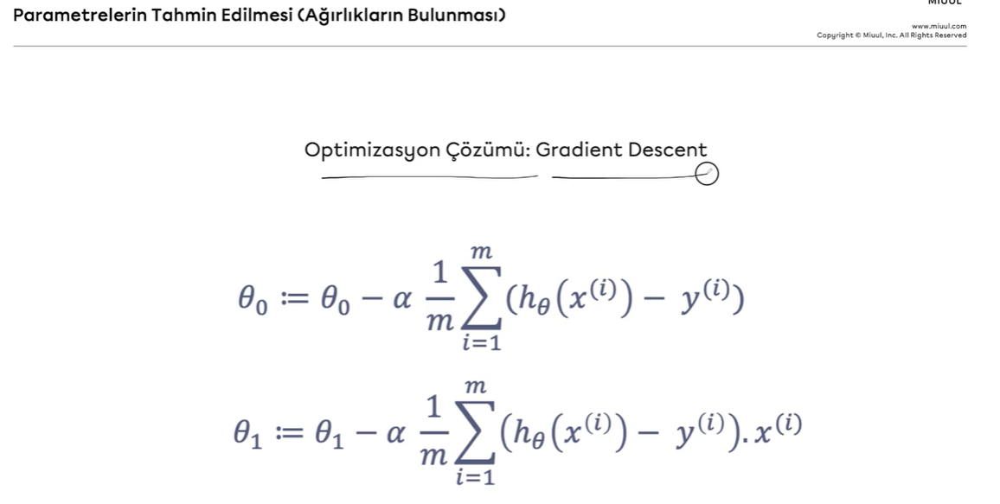

In [ ]:
#Gradient Descent :ML den bağımsız olarak bir optimizasyon yöntemidir.Bir fonksiyonun minimum olabileceği parametreleri bulmaktır.
#İlgili f(x)'in ilgili parametreye göre türev alır.Her iterasyonda hatanın değerini düşürür.

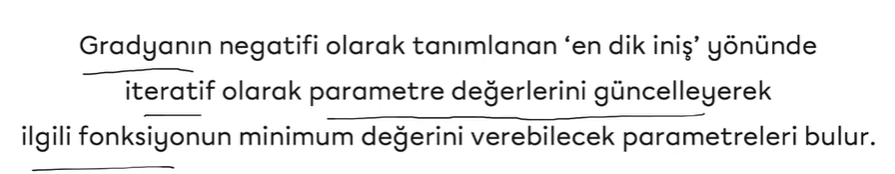


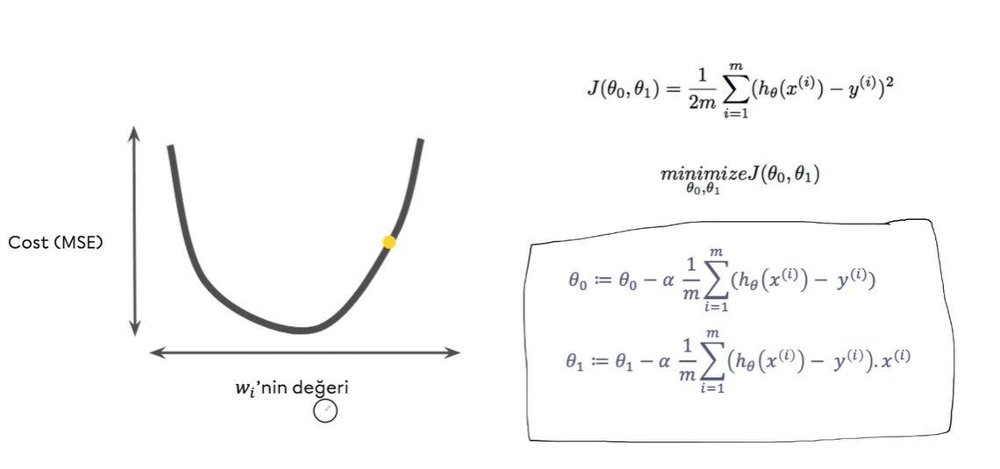

Lineer Regresyon

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error,mean_absolute_error
from sklearn.model_selection import train_test_split,cross_val_score

In [ ]:
data=pd.read_csv("advertising.csv")
data.head()

,TV,radio,newspaper,sales
0,230.1,37.8,69.2,22.1
1,44.5,39.3,45.1,10.4
2,17.2,45.9,69.3,9.3
3,151.5,41.3,58.5,18.5
4,180.8,10.8,58.4,12.9


In [ ]:
y=data[["sales"]]
X=data[["TV"]]

In [ ]:
reg_model=LinearRegression().fit(X,y)

In [ ]:
reg_model.intercept_[0] #sabit -->intercept

7.032593549127695

In [ ]:
reg_model.coef_[0][0]#ağırlık -->

0.04753664043301975

In [ ]:
#f(x)=7.03+0.0475.X

In [ ]:
reg_model.intercept_[0]+reg_model.coef_[0][0]*150

14.163089614080658

In [ ]:
y_pred=reg_model.predict(X)
y_pred

array([[17.97077451],
       [ 9.14797405],
       [ 7.85022376],
       [14.23439457],
       [15.62721814],
       [ 7.44616232],
       [ 9.76595037],
       [12.74649773],
       [ 7.44140866],
       [16.53041431],
       [10.17476548],
       [17.23871025],
       [ 8.16396559],
       [11.66741599],
       [16.73482186],
       [16.32125309],
       [10.25557777],
       [20.40940417],
       [10.32212907],
       [14.03474068],
       [17.41459582],
       [18.31779199],
       [ 7.6600772 ],
       [17.88520856],
       [ 9.99412625],
       [19.52997632],
       [13.82557947],
       [18.44614092],
       [18.85970969],
       [10.38868036],
       [20.95607553],
       [12.39948025],
       [11.653155  ],
       [19.65832525],
       [11.58185004],
       [20.85149492],
       [19.72012288],
       [10.58358059],
       [ 9.08142275],
       [17.87094757],
       [16.65876324],
       [15.44657891],
       [20.98935118],
       [16.86792445],
       [ 8.22576322],
       [15

In [ ]:
mean_squared_error(y,y_pred)

10.512652915656757

In [ ]:
print(y.mean())
y.std()
#satışların ortalaması ve standart sapması alınarak MSE değeri yorumlanabilir:
#10 büyük deriz.

sales    14.0225
dtype: float64


sales    5.217457
dtype: float64

In [ ]:
#RMSE
np.sqrt(mean_squared_error(y,y_pred))

3.2423221486546887

In [ ]:
##R^2
reg_model.score(X,y)
#tv değişkenin satış değişkeninin yüzde kaçını açıklayabildiğini gösterir.(değişiklik)

#değişken sayısı arttıkça R^2 şişmeye meyillidir. --> düzeltilmiş R^2 bakılmalıdır.

0.611875050850071

Çoklu Doğrusal Regresyon

In [ ]:
y=data[["sales"]]
X=data.drop("sales",axis=1)

In [ ]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=1)

In [ ]:
reg_model=LinearRegression()
reg_model.fit(X_train,y_train)

#reg_model=LinearRegression().fit(X_train,y_train)

LinearRegression()

In [ ]:
reg_model.intercept_

array([2.90794702])

In [ ]:
reg_model.coef_

array([[0.0468431 , 0.17854434, 0.00258619]])

In [ ]:
#sales=2.9+TV*0.04+radio*0.18+newspaper*0.002
#train RMSE
np.sqrt(mean_squared_error(y_train,reg_model.predict(X_train)))

1.736902590147092

In [ ]:
#R^2 değeri -- train
reg_model.score(X_train,y_train)

0.8959372632325174

In [ ]:
#test RMSE
y_pred=reg_model.predict(X_test)
np.sqrt(mean_squared_error(y_test,y_pred))

1.4113417558581587

In [ ]:
reg_model.score(X_test,y_test)

0.8927605914615384

In [ ]:
#10 katlı CV RMSE
np.mean(np.sqrt(-cross_val_score(reg_model,X,y,cv=10,scoring="neg_mean_squared_error")))

1.6913531708051797

Gradient Descent ile Doğrusal Regresyon

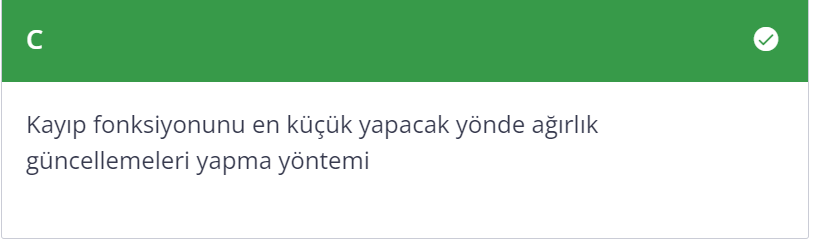

# LOJİSTİK REGRESYON


In [ ]:
#bağımlı değişken kategoriktir.

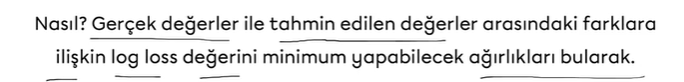

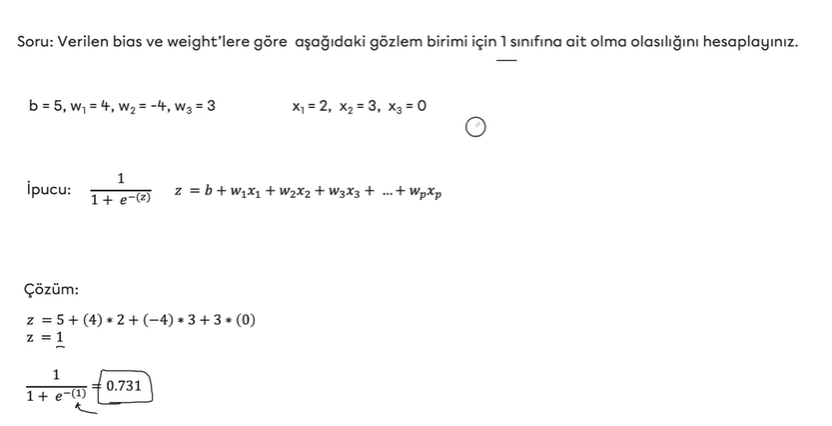

Lojistik Regresyon İçin Gradient Descent

In [ ]:
#entropi ne kadar yüksekse çeşitlilik o kadar fazladır.Biz çeşitliliğin az yani entropinin düşük olmasını isteriz.

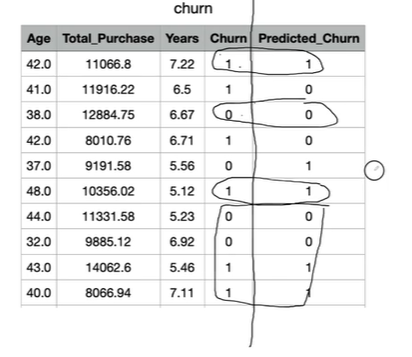

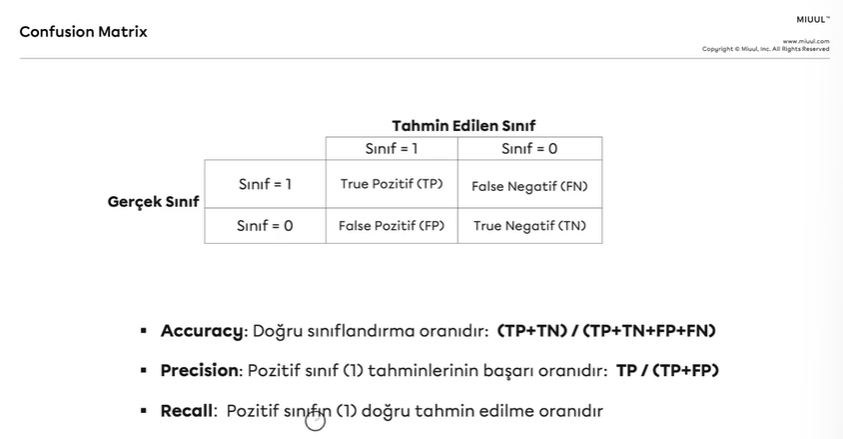

In [ ]:
#Precision : Sahtekar olarak tahminlenenlerin gerçekte ne kadarının sahtekar olduğu--1. tip hata
#Recall : Gerçekta sahtekarlık olan işlemlerinin ne kadarının doğru tahmin edildiği -- 2. tip hata

In [ ]:
#sınıflar dengesiz dağılıyorsa accuracyye bakamayız. Recall ve Precision değerleri baz alınmalıdır.
##  F1 SCORE --> 2*(Precision*Recall)/(Precision+Recall) ##

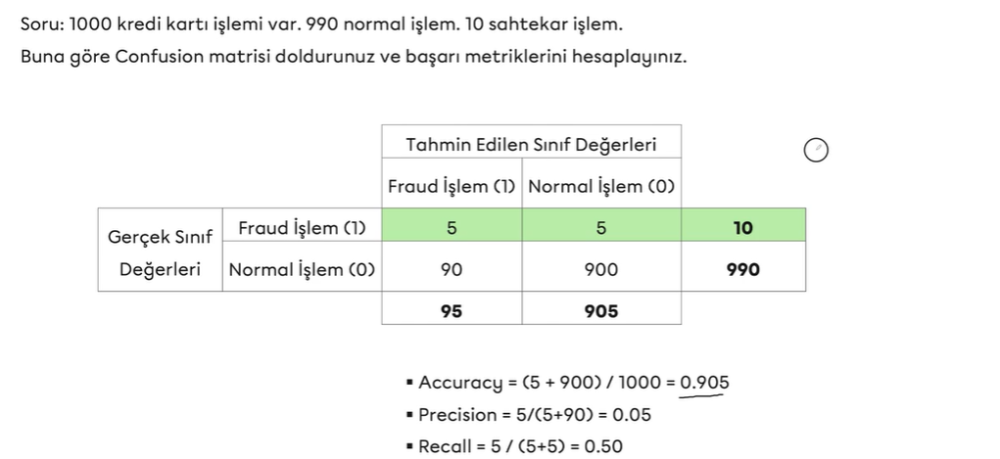

Classification Threshold

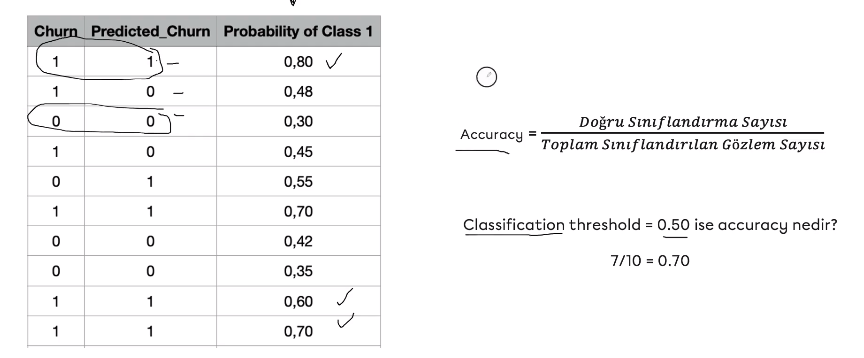

In [ ]:
#eşik değerine göre accuracy değişir. --> ön tanımlamalarında 0,50 alınır ama hep bir değişkenlik var nasıl çözerim?
### ROC EĞRİSİ ###

ROC EĞRİSİ

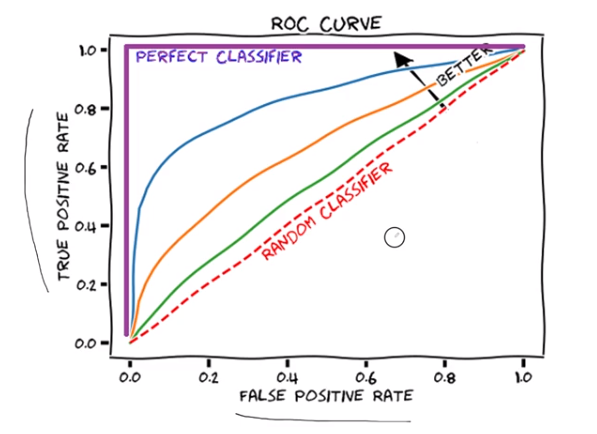

In [ ]:
#curve kapladığı alan arttıkça model başarısı artar.Olası eşik değerler üzerine karmaşıklık matrisi yapılır ve noktalar işaretlenir.

#Sayısal şakilde ifade de edilebilir.Curve altında kalan alanın integrali alınır --> AUC

AUC (Area Under Curve)

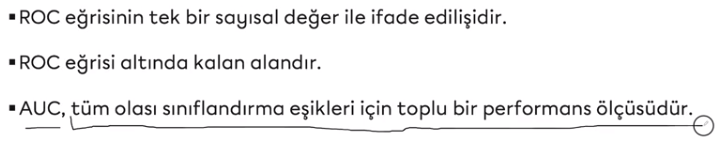

In [ ]:
#yapmış olunan sınıflandırma için fikir sahibi olmamızı sağlar.

LOG Loss

In [ ]:
#optimize etmek istediğimiz bir fonksiyon varmış gibi bakacağız.Ama bir kriter metriğidir.

In [ ]:
#preidct proba:
# bir resim sınıflandırma modelinde, bir köpeği veya bir kediyi tanımak için kullanılıyorsa, "predict_proba"
# işlevi, resmin bir köpeğe veya bir kediye ait olma olasılığını hesaplayabilir.
# Örneğin, bu işlevin çıktısı şu şekilde olabilir: "Bu resmin bir köpeğe ait olma olasılığı 0.85,
# bir kediye ait olma olasılığı ise 0.15." Bu, modelin o resmi bir köpek olarak yüksek bir güvenilirlikle
# sınıflandırdığını gösterir.

Diyabet Tahmin Modeli

In [ ]:
# 1-keşifçi veri analizi
# 2-veri ön işleme
# 3-Model ve tahminleme
# 4-Model Değerlendirme
# 5-Test Etme

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split,cross_validate
from sklearn.preprocessing import RobustScaler
from sklearn.metrics import accuracy_score,roc_auc_score,confusion_matrix,classification_report,roc_curve

In [ ]:
df=pd.read_csv("diabetes.csv")
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [ ]:
df.shape

(768, 9)

In [ ]:
df["Outcome"].value_counts()

0    500
1    268
Name: Outcome, dtype: int64

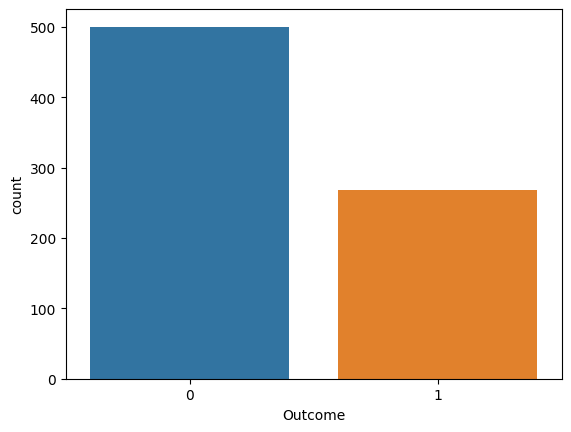

In [ ]:
sns.countplot(x="Outcome",data=df)
plt.show()

In [ ]:
100*df["Outcome"].value_counts()/len(df)

0    65.104167
1    34.895833
Name: Outcome, dtype: float64

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,768.0,3.845052,3.369578,0.000,1.00000,3.0000,6.00000,17.00
Glucose,768.0,120.894531,31.972618,0.000,99.00000,117.0000,140.25000,199.00
BloodPressure,768.0,69.105469,19.355807,0.000,62.00000,72.0000,80.00000,122.00
SkinThickness,768.0,20.536458,15.952218,0.000,0.00000,23.0000,32.00000,99.00
Insulin,768.0,79.799479,115.244002,0.000,0.00000,30.5000,127.25000,846.00
BMI,768.0,31.992578,7.884160,0.000,27.30000,32.0000,36.60000,67.10
DiabetesPedigreeFunction,768.0,0.471876,0.331329,0.078,0.24375,0.3725,0.62625,2.42
Age,768.0,33.240885,11.760232,21.000,24.00000,29.0000,41.00000,81.00
Outcome,768.0,0.348958,0.476951,0.000,0.00000,0.0000,1.00000,1.00


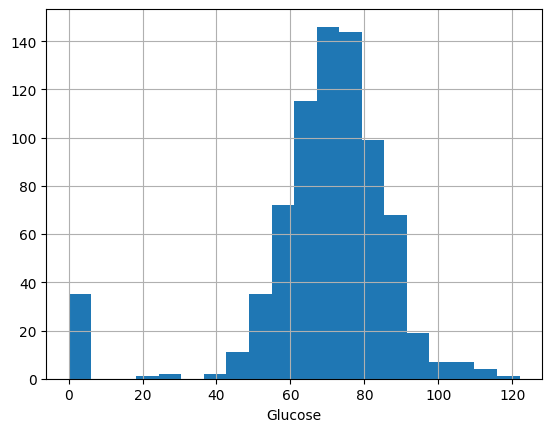

In [ ]:
df["BloodPressure"].hist(bins=20)
plt.xlabel("Glucose")
plt.show()

In [ ]:
#numeric değişkenleri görselleştir:
def plot_numerical_col(dataframe,numerical_col):
  dataframe[numerical_col].hist(bins=20)
  plt.xlabel(numerical_col)
  plt.show(block=True)

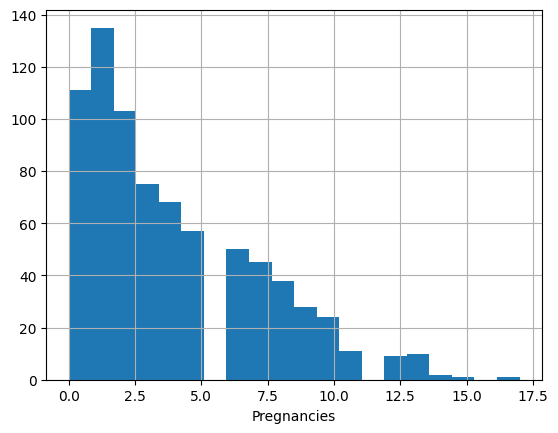

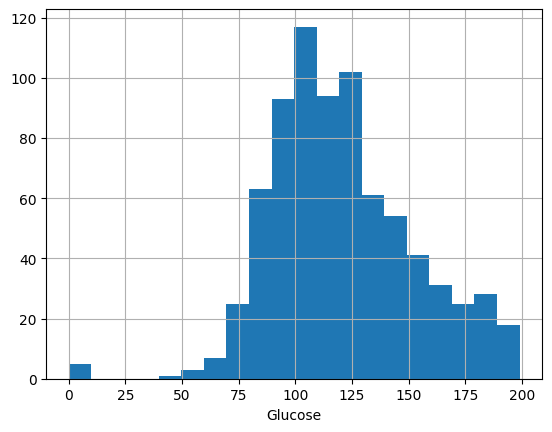

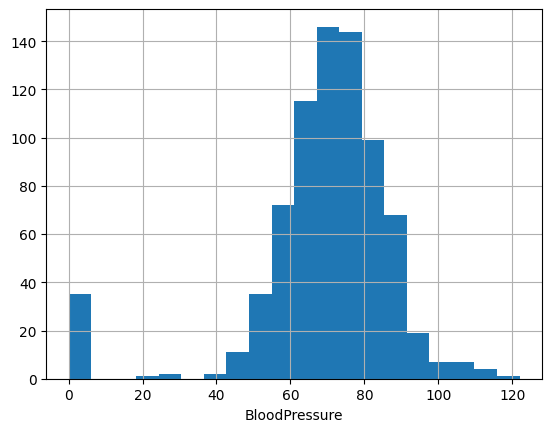

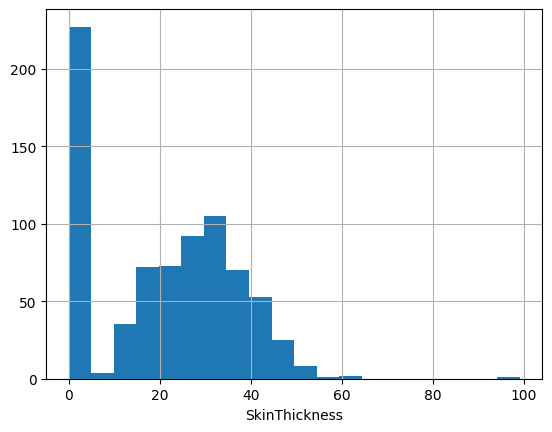

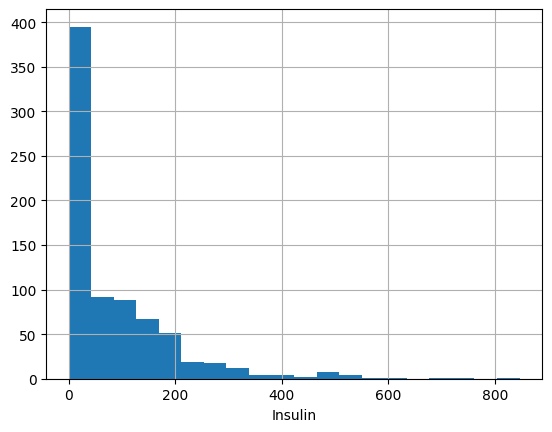

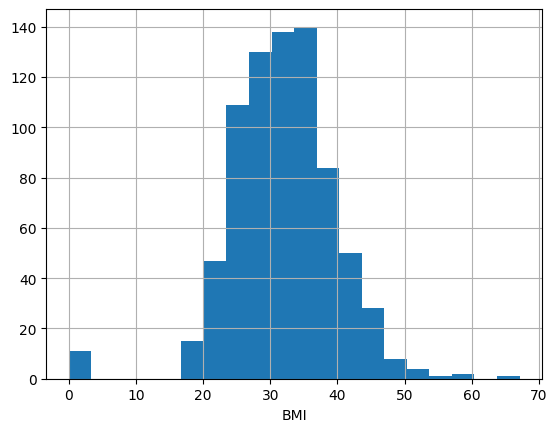

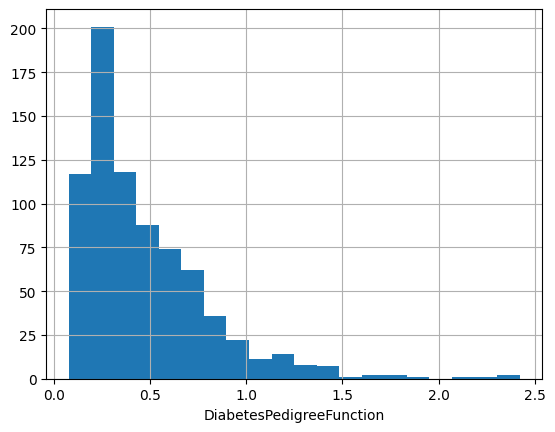

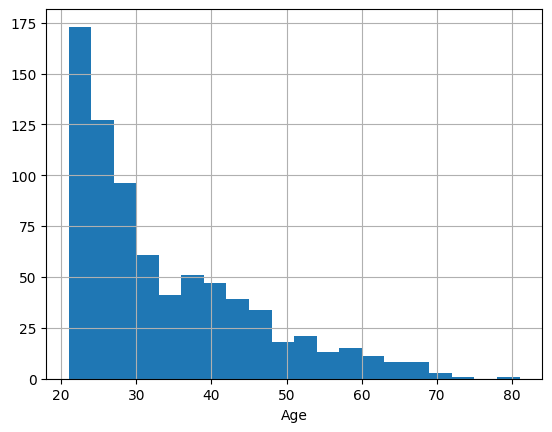

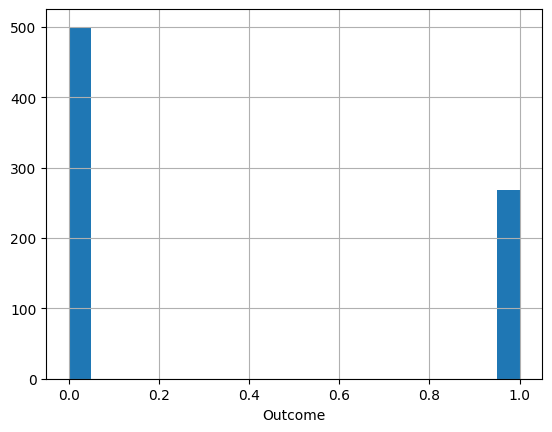

In [ ]:
for col in df.columns:
  plot_numerical_col(df,col)

In [ ]:
df.groupby("Outcome").agg({"Pregnancies": "mean"})

,Pregnancies
Outcome,
0,3.298000
1,4.865672


In [ ]:
def target_summary_with_num (dataframe,target,numerical_col):
  print(dataframe.groupby(target).agg({numerical_col : "mean"}), end="\n\n\n")

In [ ]:
for col in df.columns:
  target_summary_with_num(df,"Outcome",col)

         Pregnancies
Outcome             
0           3.298000
1           4.865672


            Glucose
Outcome            
0        109.980000
1        141.257463


         BloodPressure
Outcome               
0            68.184000
1            70.824627


         SkinThickness
Outcome               
0            19.664000
1            22.164179


            Insulin
Outcome            
0         68.792000
1        100.335821


               BMI
Outcome           
0        30.304200
1        35.142537


         DiabetesPedigreeFunction
Outcome                          
0                        0.429734
1                        0.550500


               Age
Outcome           
0        31.190000
1        37.067164


         Outcome
Outcome         
0            0.0
1            1.0




In [ ]:
df.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [ ]:
df.describe().T #bloodpressure 0 olmamalı normalde ??

,count,mean,std,min,25%,50%,75%,max
Pregnancies,768.0,3.845052,3.369578,0.000,1.00000,3.0000,6.00000,17.00
Glucose,768.0,120.894531,31.972618,0.000,99.00000,117.0000,140.25000,199.00
BloodPressure,768.0,69.105469,19.355807,0.000,62.00000,72.0000,80.00000,122.00
SkinThickness,768.0,20.536458,15.952218,0.000,0.00000,23.0000,32.00000,99.00
Insulin,768.0,79.799479,115.244002,0.000,0.00000,30.5000,127.25000,846.00
BMI,768.0,31.992578,7.884160,0.000,27.30000,32.0000,36.60000,67.10
DiabetesPedigreeFunction,768.0,0.471876,0.331329,0.078,0.24375,0.3725,0.62625,2.42
Age,768.0,33.240885,11.760232,21.000,24.00000,29.0000,41.00000,81.00
Outcome,768.0,0.348958,0.476951,0.000,0.00000,0.0000,1.00000,1.00


In [ ]:
def outlier_thresholds(dataframe,col_name,q1=0.05,q3=0.95):
  quartile1=dataframe[col_name].quantile(q1)
  quartile3=dataframe[col_name].quantile(q3)
  interquantile_range=quartile3-quartile1

  up_limit=quartile3+1.5*interquantile_range
  low_limit = quartile1-1.5*interquantile_range

  return low_limit,up_limit
  #normalde eşik değerler böyle olmalı :q1=0.25,q3=0.75 , fakat burda biz kendi yorumumuzu katıyoruz.

In [ ]:
def check_outlier(dataframe,col_name):
  low_limit,up_limit =outlier_thresholds(dataframe,col_name)
  if dataframe[(dataframe[col_name] > up_limit) | (dataframe[col_name] < low_limit)].any(axis=None):
    return True
  else:
    return False

In [ ]:
for col in df.columns:
  print(col,check_outlier(df,col))

Pregnancies False
Glucose False
BloodPressure False
SkinThickness False
Insulin True
BMI False
DiabetesPedigreeFunction False
Age False
Outcome False


In [ ]:
#Aykırı değerlerin baskılanması
def replace_with_thresholds(dataframe,variable):
  low_limit,up_limit=outlier_thresholds(dataframe,variable)
  dataframe.loc[(dataframe[variable] < low_limit),variable] = low_limit
  dataframe.loc[(dataframe[variable]> low_limit),variable]=up_limit

In [ ]:
for col in df.columns:
  replace_with_thresholds(df,"Insulin")

In [ ]:
for col in df.columns:
  print(col,check_outlier(df,col))

Pregnancies False
Glucose False
BloodPressure False
SkinThickness False
Insulin False
BMI False
DiabetesPedigreeFunction False
Age False
Outcome False


In [ ]:
cols=df.drop("Outcome",axis=1)

In [ ]:
#robust scaler: değişkenlerden medyanı çıkartıp rangelerine bölüyor.Aykırı değerlerden etkilenmez standartscalerın aksine
#min-max scalerda kullanılabilir.(0-1 arasında değerler)
for col in cols:
  df[col]=RobustScaler().fit_transform(df[[col]])

In [ ]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,0.6,0.751515,0.000000,0.37500,0.0,0.172043,0.665359,1.235294,1
1,-0.4,-0.775758,-0.333333,0.18750,0.0,-0.580645,-0.056209,0.117647,0
2,1.0,1.600000,-0.444444,-0.71875,0.0,-0.935484,0.783007,0.176471,1
3,-0.4,-0.678788,-0.333333,0.00000,0.0,-0.419355,-0.537255,-0.470588,0
4,-0.6,0.484848,-1.777778,0.37500,0.0,1.193548,5.007843,0.235294,1


In [ ]:
#Modelleme
y=df["Outcome"]
X=df.drop(["Outcome"],axis=1)

In [ ]:
log_model=LogisticRegression().fit(X,y)

In [ ]:
log_model.intercept_

array([-1.29605689])

In [ ]:
log_model.coef_

array([[ 0.60521829,  1.35349141, -0.22743233, -0.09444587,  0.        ,
         0.8198906 ,  0.34460742,  0.27053344]])

In [ ]:
y_pred=log_model.predict(X)

In [ ]:
y_pred[0:10]

array([1, 0, 1, 0, 1, 0, 0, 1, 1, 0])

In [ ]:
y[0:10]

0    1
1    0
2    1
3    0
4    1
5    0
6    1
7    0
8    1
9    1
Name: Outcome, dtype: int64

In [ ]:
#model başarı değerlendirme
def plot_confusion_matrix(y,y_pred):
  acc=round(accuracy_score(y,y_pred),2)
  cm=confusion_matrix(y,y_pred)
  sns.heatmap(cm,annot=True,fmt=".0f")
  plt.xlabel("y_pred")
  plt.ylabel("y")
  plt.title("Accuracy Score : {0}".format(acc),size=10)
  plt.show()

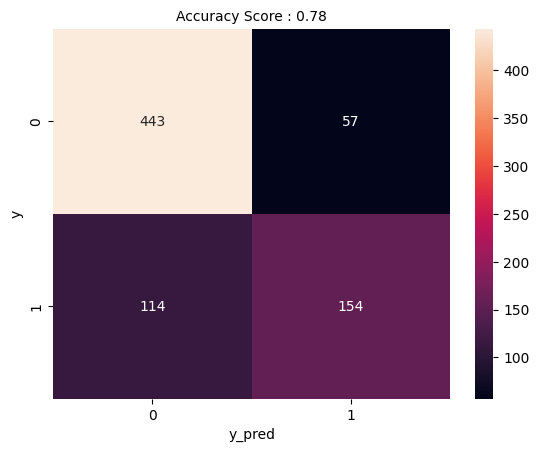

In [ ]:
plot_confusion_matrix(y,y_pred)

In [ ]:
print(classification_report(y,y_pred))
#normalde ana odak 1'dir fakat her ikisini dikkate almak istersek en altta ortalamalar verilir.

              precision    recall  f1-score   support

           0       0.80      0.89      0.84       500
           1       0.73      0.57      0.64       268

    accuracy                           0.78       768
   macro avg       0.76      0.73      0.74       768
weighted avg       0.77      0.78      0.77       768



In [ ]:
y_prob=log_model.predict_proba(X)[:,1]
roc_auc_score(y,y_pred)

0.730313432835821

In [ ]:
#Model Doğrulama
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=17)

In [ ]:
log_model=LogisticRegression().fit(X_train,y_train)

In [ ]:
y_pred=log_model.predict(X_test)

In [ ]:
y_prob=log_model.predict_proba(X_test)[:,1]

In [ ]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.77      0.92      0.84        97
           1       0.79      0.54      0.65        57

    accuracy                           0.78       154
   macro avg       0.78      0.73      0.74       154
weighted avg       0.78      0.78      0.77       154



In [ ]:
from sklearn.metrics import RocCurveDisplay

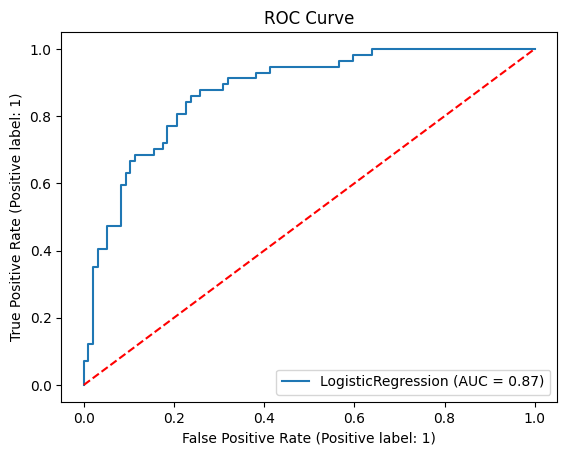

0.8744800144691626

In [ ]:
RocCurveDisplay.from_estimator(log_model,X_test,y_test)
plt.title("ROC Curve")
plt.plot([0,1],[0,1],"r--")
plt.show()

roc_auc_score(y_test,y_prob)

In [ ]:
#Çapraz Doğrulama
y=df["Outcome"]
X=df.drop(["Outcome"],axis=1)

log_model=LogisticRegression().fit(X,y)

cv_results=cross_validate(log_model,X,y,cv=5,scoring=["accuracy","precision","recall","f1","roc_auc"])

In [ ]:
cv_results

{'fit_time': array([0.00643301, 0.00582337, 0.00392294, 0.00316548, 0.0032289 ]),
 'score_time': array([0.00867462, 0.01122427, 0.00640607, 0.00604844, 0.00610065]),
 'test_accuracy': array([0.77272727, 0.74675325, 0.75974026, 0.80392157, 0.75816993]),
 'test_precision': array([0.71111111, 0.64705882, 0.70731707, 0.7804878 , 0.71052632]),
 'test_recall': array([0.59259259, 0.61111111, 0.53703704, 0.60377358, 0.50943396]),
 'test_f1': array([0.64646465, 0.62857143, 0.61052632, 0.68085106, 0.59340659]),
 'test_roc_auc': array([0.81259259, 0.80814815, 0.82962963, 0.87358491, 0.84226415])}

In [ ]:
cv_results["test_accuracy"]

array([0.77272727, 0.74675325, 0.75974026, 0.80392157, 0.75816993])

In [ ]:
cv_results["test_accuracy"].mean()

0.7682624564977505

In [ ]:
cv_results["test_f1"].mean()

0.631964009612386

In [ ]:
#dengeli bir veri olmadığı için sadece accuarcy ile değil diğer skorlara da bakılmalı.

# K EN YAKIN KOMŞU

In [ ]:
#gözlemlerin birbirine olan benzerlikleri üzerinden yapılır.
#           "Bana arkadaşını söyle sana kim olduğunu söylim"        #

#hem sınıflandırma hem regresyon problemleri :)

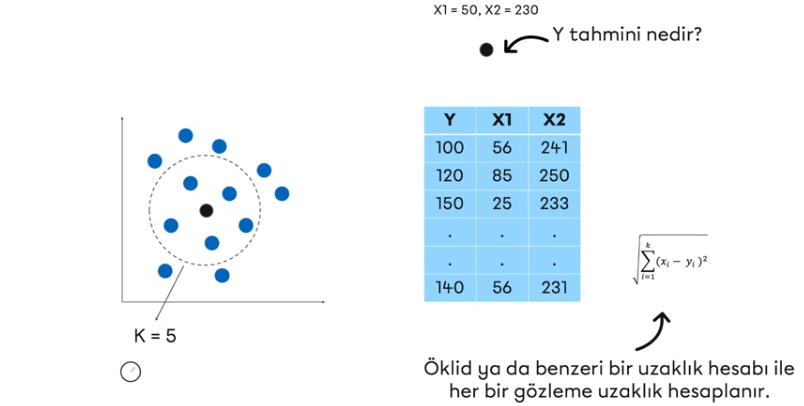

In [ ]:
#regresyon modellerinde uzaklık hesabı , sınıflandırma problemlerinde moda bakılır.

In [ ]:
import pandas as pd
from sklearn.metrics import classification_report,roc_auc_score
from sklearn.model_selection import GridSearchCV,cross_validate
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler

In [ ]:
df=pd.read_csv("diabetes.csv")
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [ ]:
y=df["Outcome"]
X=df.drop(["Outcome"],axis=1)
#bağımsız değişkenleri standartlaştırma
X_scaled=StandardScaler().fit_transform(X)#array olarak dönüyor.
X=pd.DataFrame(X_scaled,columns=X.columns)
X

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,0.639947,0.848324,0.149641,0.907270,-0.692891,0.204013,0.468492,1.425995
1,-0.844885,-1.123396,-0.160546,0.530902,-0.692891,-0.684422,-0.365061,-0.190672
2,1.233880,1.943724,-0.263941,-1.288212,-0.692891,-1.103255,0.604397,-0.105584
3,-0.844885,-0.998208,-0.160546,0.154533,0.123302,-0.494043,-0.920763,-1.041549
4,-1.141852,0.504055,-1.504687,0.907270,0.765836,1.409746,5.484909,-0.020496
...,...,...,...,...,...,...,...,...
763,1.827813,-0.622642,0.356432,1.722735,0.870031,0.115169,-0.908682,2.532136
764,-0.547919,0.034598,0.046245,0.405445,-0.692891,0.610154,-0.398282,-0.531023
765,0.342981,0.003301,0.149641,0.154533,0.279594,-0.735190,-0.685193,-0.275760
766,-0.844885,0.159787,-0.470732,-1.288212,-0.692891,-0.240205,-0.371101,1.170732


In [ ]:
#modelleme
knn_model=KNeighborsClassifier().fit(X,y)

In [ ]:
random_user=X.sample(1,random_state=45)
random_user

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
195,0.342981,1.161295,0.770014,1.283638,1.130518,0.940144,-0.232176,-0.360847


In [ ]:
knn_model.predict(random_user)

array([1])

In [ ]:
#model başarı değerlendirme
y_pred=knn_model.predict(X)

y_prob=knn_model.predict_proba(X)[:,1]
print(classification_report(y,y_pred))

              precision    recall  f1-score   support

           0       0.85      0.90      0.87       500
           1       0.79      0.70      0.74       268

    accuracy                           0.83       768
   macro avg       0.82      0.80      0.81       768
weighted avg       0.83      0.83      0.83       768



In [ ]:
roc_auc_score(y,y_prob)

0.9017686567164179

In [ ]:
#doğrulama
cv_research=cross_validate(knn_model,X,y,cv=5,scoring=["accuracy","f1","roc_auc"])
cv_research

{'fit_time': array([0.00320697, 0.00176597, 0.00261879, 0.0018096 , 0.00184727]),
 'score_time': array([0.01349926, 0.01330924, 0.01442075, 0.01310992, 0.03716063]),
 'test_accuracy': array([0.72077922, 0.73376623, 0.71428571, 0.77124183, 0.7254902 ]),
 'test_f1': array([0.58252427, 0.60952381, 0.54166667, 0.63917526, 0.58      ]),
 'test_roc_auc': array([0.77555556, 0.78759259, 0.73194444, 0.83226415, 0.77528302])}

In [ ]:
print(cv_research["test_accuracy"].mean())
print(cv_research["test_f1"].mean())
print(cv_research["test_roc_auc"].mean())

0.733112638994992
0.5905780011534191
0.7805279524807827


In [ ]:
knn_model.get_params()

{'algorithm': 'auto',
 'leaf_size': 30,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 5,
 'p': 2,
 'weights': 'uniform'}

In [ ]:
#optimizasyon
knn_model=KNeighborsClassifier()
knn_model.get_params()

{'algorithm': 'auto',
 'leaf_size': 30,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 5,
 'p': 2,
 'weights': 'uniform'}

In [ ]:
knn_params={"n_neighbors":range(2,50)}

In [ ]:
knn_gs_best=GridSearchCV(knn_model,knn_params,cv=5,n_jobs=-1,verbose=1).fit(X,y)

Fitting 5 folds for each of 48 candidates, totalling 240 fits


In [ ]:
knn_gs_best.best_params_

{'n_neighbors': 17}

In [ ]:
#final model
knn_final=knn_model.set_params(**knn_gs_best.best_params_).fit(X,y)#yazmay yerine ** kullanarak otomati atadık.

In [ ]:
cv_results=cross_validate(knn_final,X,y,cv=5,scoring=["accuracy","f1","roc_auc"])
cv_results

{'fit_time': array([0.00346637, 0.00244498, 0.00239921, 0.00240231, 0.00241065]),
 'score_time': array([0.02346897, 0.01905394, 0.01872778, 0.01918936, 0.02064252]),
 'test_accuracy': array([0.75324675, 0.74025974, 0.75974026, 0.81045752, 0.77124183]),
 'test_f1': array([0.60416667, 0.60784314, 0.57471264, 0.70103093, 0.59770115]),
 'test_roc_auc': array([0.80675926, 0.7912037 , 0.79166667, 0.84603774, 0.82830189])}

In [ ]:
cv_results["test_f1"].mean()

0.6170909049720137

# CART (Classification and Regression Tree)

In [ ]:
#random forestın temelini oluşturur.
#en tepede görülen değişken en önemli değişkendir.

#kararları bölen noktalara bölüm noktaları denir.

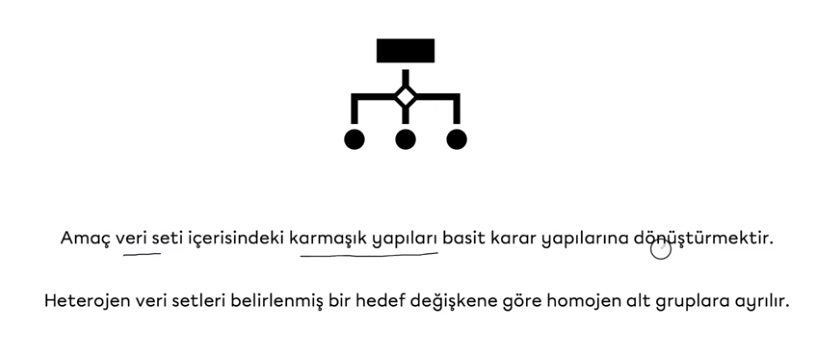


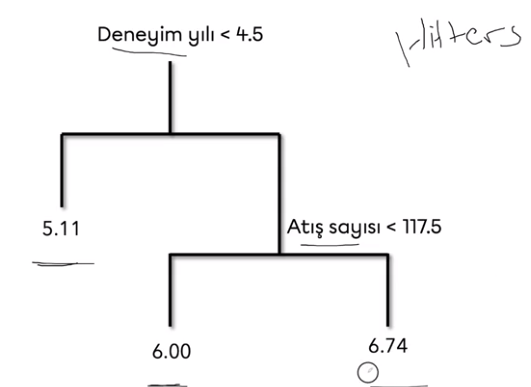

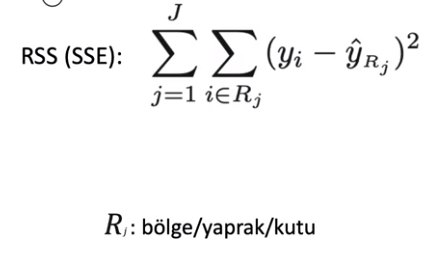

In [ ]:
#ağacı nasıl oluşturmalıyım : RSS(SSE) in en küçük olduğu noktalarda bulunsun yapraklar.
#tahmin edilen değerler burda --> kutulardaki değerlerin ortalamaları.

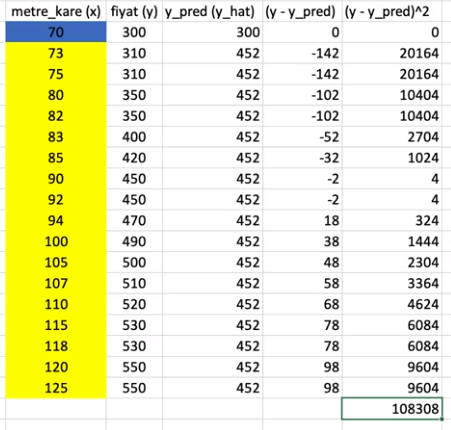


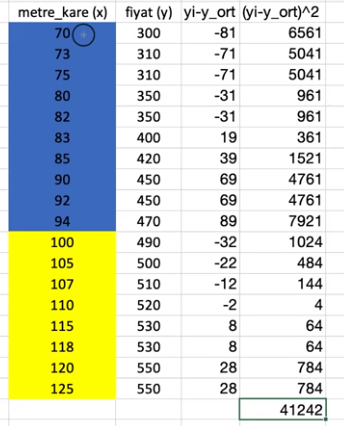

Modelleme

In [ ]:
!pip install pydotplus
!pip install skompiler
!pip install astor
!pip install joblib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.5/45.5 kB 1.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for skompiler: filename=SKompiler-0.7-py3-none-any.whl size=54311 sha256=de06c402105c51805028c867367398348a19d8db22f755c161f87bc6e6522bf8
  Stored in directory: /root/.cache/pip/wheels/c0/22/3d/bd8fd4c6cd205cf122a0974be908681472a6f44abd6b880614
Successfully built skompiler


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import warnings

import joblib
import pydotplus

from sklearn.tree import DecisionTreeClassifier,export_graphviz,export_text
from sklearn.metrics import classification_report,roc_auc_score
from sklearn.model_selection import train_test_split,GridSearchCV,cross_validate,validation_curve
from skompiler import skompile

In [ ]:
warnings.simplefilter(action="ignore",category=Warning)

In [ ]:
df=pd.read_csv("diabetes.csv")
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [ ]:
y=df["Outcome"]
X=df.drop(["Outcome"],axis=1)

cart_model=DecisionTreeClassifier(random_state=1).fit(X,y)

In [ ]:
y_pred=cart_model.predict(X)

In [ ]:
#AUC için y_prob
y_prob=cart_model.predict_proba(X)[:,1]

In [ ]:
print(classification_report(y,y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       500
           1       1.00      1.00      1.00       268

    accuracy                           1.00       768
   macro avg       1.00      1.00      1.00       768
weighted avg       1.00      1.00      1.00       768



In [ ]:
#başarımı nasıl değerlendiririm?
roc_auc_score(y,y_prob)

1.0

In [ ]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=17)

In [ ]:
cart_model=DecisionTreeClassifier(random_state=17).fit(X_train,y_train)

#train hatası
y_pred=cart_model.predict(X_train)
y_prob=cart_model.predict_proba(X_train)[:,1]
print(classification_report(y_train,y_pred))
print(roc_auc_score(y_train,y_prob))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       350
           1       1.00      1.00      1.00       187

    accuracy                           1.00       537
   macro avg       1.00      1.00      1.00       537
weighted avg       1.00      1.00      1.00       537

1.0


In [ ]:
y_pred=cart_model.predict(X_test)
y_prob=cart_model.predict_proba(X_test)[:,1]
print(classification_report(y_test,y_pred))
print(roc_auc_score(y_test,y_prob))

              precision    recall  f1-score   support

           0       0.77      0.78      0.77       150
           1       0.58      0.57      0.58        81

    accuracy                           0.71       231
   macro avg       0.68      0.67      0.67       231
weighted avg       0.70      0.71      0.70       231

0.6739506172839506


In [ ]:
#random state değeri değiştirilerekte skorlar değişir.

In [ ]:
cart_model=DecisionTreeClassifier(random_state=17).fit(X,y)
cv_results=cross_validate(cart_model,X,y,cv=5,scoring=["accuracy","f1","roc_auc"])
cv_results

{'fit_time': array([0.00399208, 0.00657201, 0.0034771 , 0.00376964, 0.00453734]),
 'score_time': array([0.00439739, 0.00421619, 0.00416756, 0.0040853 , 0.00411844]),
 'test_accuracy': array([0.69480519, 0.65584416, 0.66883117, 0.78431373, 0.7254902 ]),
 'test_f1': array([0.52525253, 0.56910569, 0.51428571, 0.66666667, 0.58      ]),
 'test_roc_auc': array([0.64574074, 0.65407407, 0.63      , 0.74632075, 0.68358491])}

In [ ]:
#hiperparametre
cart_model.get_params()

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'random_state': 17,
 'splitter': 'best'}

In [ ]:
cart_params={"max_depth" : range(1,11),
             "min_samples_split":range(2,20)}
#scoring = argümanı vermesen "accuarcy" dir.
card_best_grid=GridSearchCV(cart_model,cart_params,scoring="f1",cv=5,n_jobs=-1,verbose=True).fit(X,y)

Fitting 5 folds for each of 180 candidates, totalling 900 fits


In [ ]:
card_best_grid.best_params_

{'max_depth': 4, 'min_samples_split': 2}

In [ ]:
card_best_grid.best_score_

0.6395752751155839

In [ ]:
#Final Model
cart_final=DecisionTreeClassifier(**card_best_grid.best_params_,random_state=17).fit(X,y)
cart_final.get_params()

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': 4,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'random_state': 17,
 'splitter': 'best'}

In [ ]:
cart_final=cart_model.set_params(**card_best_grid.best_params_).fit(X,y)

cv_results=cross_validate(cart_final,X,y,cv=5,scoring=["accuracy","f1","roc_auc"])
cv_results

{'fit_time': array([0.0052464 , 0.00362825, 0.00380349, 0.00374126, 0.00325894]),
 'score_time': array([0.01039052, 0.01000118, 0.00521827, 0.00536561, 0.00737906]),
 'test_accuracy': array([0.72727273, 0.68181818, 0.74025974, 0.77124183, 0.73202614]),
 'test_f1': array([0.61818182, 0.59504132, 0.62264151, 0.7008547 , 0.66115702]),
 'test_roc_auc': array([0.79268519, 0.73      , 0.78611111, 0.84216981, 0.78924528])}

In [ ]:
#feature importance
cart_final.feature_importances_

array([0.        , 0.57356884, 0.01036258, 0.        , 0.01795319,
       0.25386917, 0.        , 0.14424622])

In [ ]:
def plot_importance(model,features,num=len(X),save=False):
  feature_imp=pd.DataFrame({"Value":model.feature_importances_,"Feature":features.columns})
  plt.figure(figsize=(6,6))
  sns.set(font_scale=1)
  sns.barplot(x="Value",y="Feature",data=feature_imp.sort_values(by="Value",ascending=False)[0:num])

  plt.title("Features")
  plt.tight_layout()
  plt.show()
  if save :
    plt.savefig("importances.png")

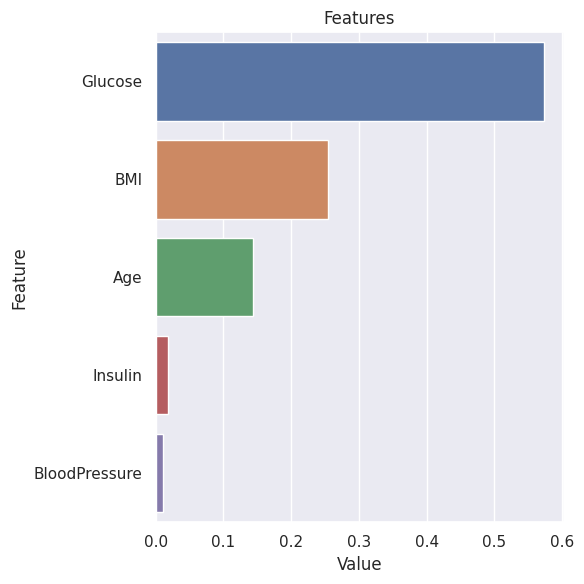

In [ ]:
plot_importance(cart_model,X,num=5)

In [ ]:
train_score,test_score=validation_curve(cart_final,X,y,
                                        param_name="max_depth",
                                        param_range=range(1,11),
                                        scoring="roc_auc",
                                        cv=10)

In [ ]:
mean_test_score=np.mean(test_score,axis=1)
mean_train_score=np.mean(train_score,axis=1)

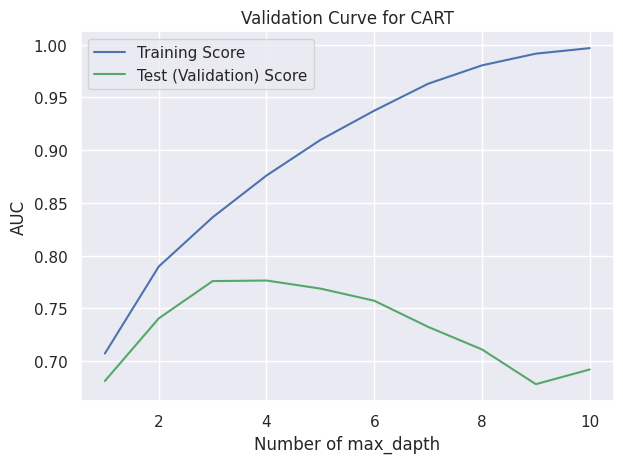

In [ ]:
plt.plot(range(1,11),mean_train_score,label="Training Score",color="b")
plt.plot(range(1,11),mean_test_score,label="Test (Validation) Score",color="g")

plt.title("Validation Curve for CART")
plt.xlabel("Number of max_dapth")
plt.ylabel("AUC")
plt.tight_layout()
plt.legend(loc="best")
plt.show()

In [ ]:
#sanki kritik nokta 3 olmalı gibi ?? Fakat sadece max_depthe bakmıyoruz.Bir kombinasyon var.

In [ ]:
import graphviz

In [ ]:
def tree_graph(model,col_names,file_name):
  tree_str=export_graphviz(model,feature_names=col_names,filled=True,out_file=None)
  graph=pydotplus.graph_from_dot_data(tree_str)
  graph.write_png(file_name)

In [ ]:
tree_graph(cart_model,X.columns,file_name="cart_final.png")

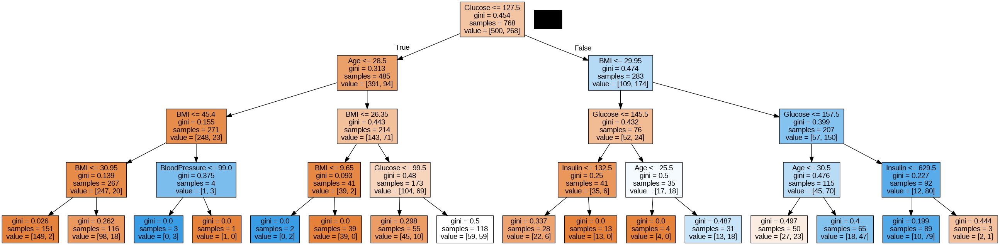

In [ ]:
cart_final.get_params()

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': 4,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'random_state': 17,
 'splitter': 'best'}

In [ ]:
#Karar Kuralları
tree_rules=export_text(cart_final,feature_names=list(X.columns))
print(tree_rules)

|--- Glucose <= 127.50
|   |--- Age <= 28.50
|   |   |--- BMI <= 45.40
|   |   |   |--- BMI <= 30.95
|   |   |   |   |--- class: 0
|   |   |   |--- BMI >  30.95
|   |   |   |   |--- class: 0
|   |   |--- BMI >  45.40
|   |   |   |--- BloodPressure <= 99.00
|   |   |   |   |--- class: 1
|   |   |   |--- BloodPressure >  99.00
|   |   |   |   |--- class: 0
|   |--- Age >  28.50
|   |   |--- BMI <= 26.35
|   |   |   |--- BMI <= 9.65
|   |   |   |   |--- class: 1
|   |   |   |--- BMI >  9.65
|   |   |   |   |--- class: 0
|   |   |--- BMI >  26.35
|   |   |   |--- Glucose <= 99.50
|   |   |   |   |--- class: 0
|   |   |   |--- Glucose >  99.50
|   |   |   |   |--- class: 0
|--- Glucose >  127.50
|   |--- BMI <= 29.95
|   |   |--- Glucose <= 145.50
|   |   |   |--- Insulin <= 132.50
|   |   |   |   |--- class: 0
|   |   |   |--- Insulin >  132.50
|   |   |   |   |--- class: 0
|   |   |--- Glucose >  145.50
|   |   |   |--- Age <= 25.50
|   |   |   |   |--- class: 0
|   |   |   |--- Age >  25

In [ ]:
#karar kurallarının python kodlarını çıkartma
#pip install scikit-learn==0.23.1 --> bu versiyonda var.

print(skompile(cart_final.predict).to("python/code"))
print(skompile(cart_final.predict).to("excel"))
#print(skompile(cart_final.predict).to("sqlalchemy/sqlite"))

((((0 if x[5] <= 30.949999809265137 else 0) if x[5] <= 45.39999961853027 else
    1 if x[2] <= 99.0 else 0) if x[7] <= 28.5 else (1 if x[5] <= 
    9.649999618530273 else 0) if x[5] <= 26.350000381469727 else 0 if x[1] <=
    99.5 else 0) if x[1] <= 127.5 else ((0 if x[4] <= 132.5 else 0) if x[1] <=
    145.5 else 0 if x[7] <= 25.5 else 1) if x[5] <= 29.949999809265137 else
    (0 if x[7] <= 30.5 else 1) if x[1] <= 157.5 else 1 if x[4] <= 629.5 else 0)

A1=IF((x2<=127.5),IF((x ...223 chars skipped... ((x5<=629.5),1,0))))


In [ ]:
#python kodları  ile tahmin işlemleri
def predict_with_rules(x):
  return ((((0 if x[5] <= 30.949999809265137 else 0) if x[5] <= 45.39999961853027 else
    1 if x[2] <= 99.0 else 0) if x[7] <= 28.5 else (1 if x[5] <=
    9.649999618530273 else 0) if x[5] <= 26.350000381469727 else 0 if x[1] <=
    99.5 else 0) if x[1] <= 127.5 else ((0 if x[4] <= 132.5 else 0) if x[1] <=
    145.5 else 0 if x[7] <= 25.5 else 1) if x[5] <= 29.949999809265137 else
    (0 if x[7] <= 30.5 else 1) if x[1] <= 157.5 else 1 if x[4] <= 629.5 else 0)

In [ ]:
X.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age'],
      dtype='object')

In [ ]:
x=[12,13,20,23,4,55,12,7]
predict_with_rules(x)

1

In [ ]:
#Model kaydetme ve çağırma
joblib.dump(cart_final,"cart_final.pkl")

['cart_final.pkl']

In [ ]:
cart_model_from_disc=joblib.load("cart_final.pkl")

In [ ]:
cart_model_from_disc.predict(pd.DataFrame(x).T)

array([1])

#GELİŞMİŞ AĞAÇ YÖNTEMLERİ

RANDOM FOREST

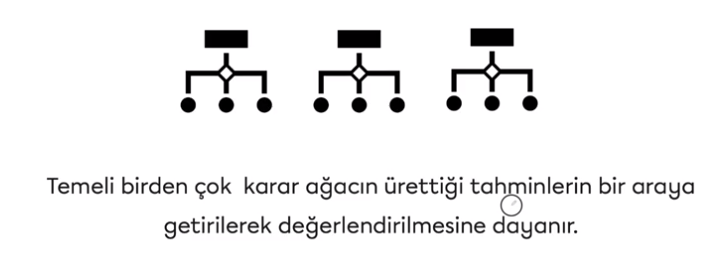

In [ ]:
#CART'ın aşırı öğrenmesi sorununu çözmek için bu yöntemi geliştirmiş.

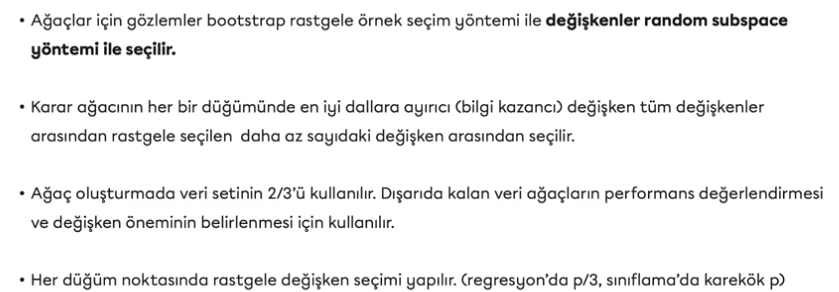

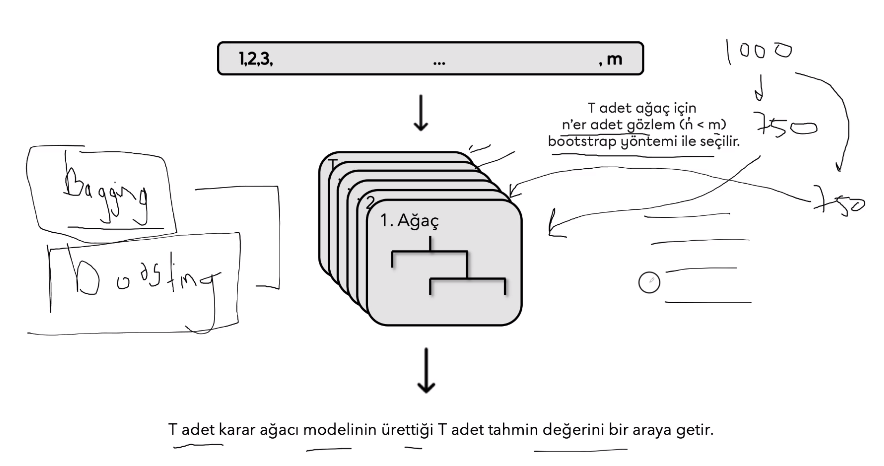

In [ ]:
#bagging:herhangi bir tekli ağacı boosting yöntemiyle takrar tekrar oluşturması yöntemidir.

Modelleme

In [ ]:
!pip install catboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 8.8 MB/s eta 0:00:00


In [ ]:
import warnings
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier,VotingClassifier
from sklearn.model_selection import GridSearchCV,cross_validate,RandomizedSearchCV,validation_curve

from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

In [ ]:
df=pd.read_csv("diabetes.csv")
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


Random Forest

In [ ]:
y=df["Outcome"]
X=df.drop(["Outcome"],axis=1)

rf_model =RandomForestClassifier(random_state=17)
rf_model.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 17,
 'verbose': 0,
 'warm_start': False}

In [ ]:
cv_results=cross_validate(rf_model,X,y,cv=5,scoring=["accuracy","f1","roc_auc"])

print(cv_results["test_accuracy"].mean())
print(cv_results["test_f1"].mean())
cv_results["test_roc_auc"].mean()

0.7656820303879128
0.6353760846367027


0.8282634521313768

In [ ]:
"""
rf_params={"max_depth":[5,8,None],
           "max_features":[3,5,7,"auto"],
           "min_samples_split":[2,5,8,15,20],
           "n_estimators":[100,200,500]} #ağaç sayısı

rf_best_grid=GridSearchCV(rf_model,rf_params,cv=5,n_jobs=-1,verbose=True).fit(X,y)

"""

'\nrf_params={"max_depth":[5,8,None],\n           "max_features":[3,5,7,"auto"],\n           "min_samples_split":[2,5,8,15,20],\n           "n_estimators":[100,200,500]} #ağaç sayısı\n\nrf_best_grid=GridSearchCV(rf_model,rf_params,cv=5,n_jobs=-1,verbose=True).fit(X,y)\n\n'

In [ ]:
#rf_best_grid.best_params_

In [ ]:
"""
rf_final=rf_model.set_params(**rf_best_grid.best_params_,random_state=17).fit(X,y)
cv_results=cross_validate(rf_final,X,y,cv=5,scoring=["accuracy","f1","roc_auc"])
"""

'\nrf_final=rf_model.set_params(**rf_best_grid.best_params_,random_state=17).fit(X,y)\ncv_results=cross_validate(rf_final,X,y,cv=5,scoring=["accuracy","f1","roc_auc"])\n'

In [ ]:
#cv_results

Gradient Boosting

AdaBoost:Zayıf öğreniciler bir araya gelerek güçlü bir öğrenici oluşturur.

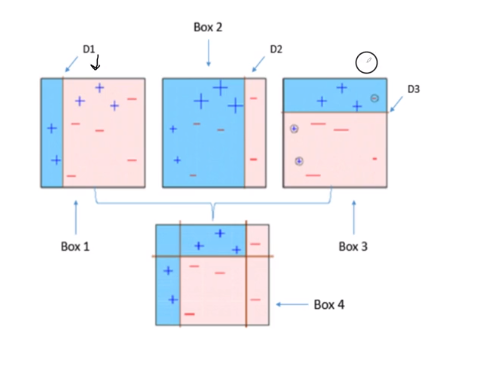

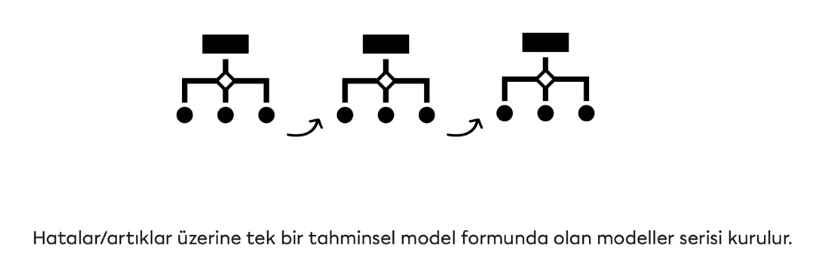

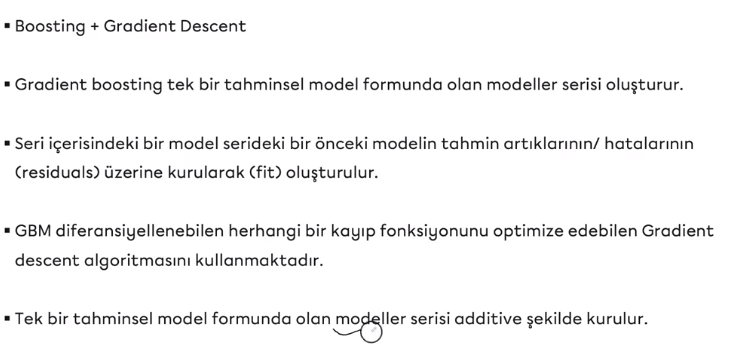

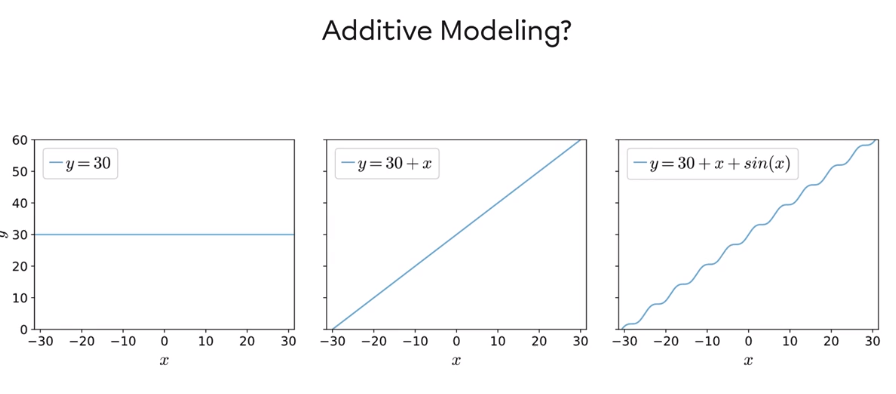

In [ ]:
y=df["Outcome"]
X=df.drop(["Outcome"],axis=1)

In [ ]:
gbm_model=GradientBoostingClassifier(random_state=17)
gbm_model.get_params()

{'ccp_alpha': 0.0,
 'criterion': 'friedman_mse',
 'init': None,
 'learning_rate': 0.1,
 'loss': 'log_loss',
 'max_depth': 3,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_iter_no_change': None,
 'random_state': 17,
 'subsample': 1.0,
 'tol': 0.0001,
 'validation_fraction': 0.1,
 'verbose': 0,
 'warm_start': False}

In [ ]:
#from sklearn.model_selection import cross_validate
gbm_cv_result=cross_validate(gbm_model,X,y,cv=5,scoring=["accuracy","f1","roc_auc"])
print(gbm_cv_result["test_accuracy"].mean())
print(gbm_cv_result["test_f1"].mean())
print(gbm_cv_result["test_roc_auc"].mean())

0.7591715474068416
0.634235802826363
0.8254867225716283


In [ ]:
gbm_params={
    "learning_rate" : [0.01,0.1],
    "max_depth" : [3,8,10],
    "n_estimators" : [100,500,1000],
    "subsample" : [1,0.5,0.7]
}

In [ ]:
from sklearn.model_selection import GridSearchCV
gbm_model_grid=GridSearchCV(gbm_model,gbm_params,cv=2,n_jobs=-1,verbose=True).fit(X,y)

Fitting 2 folds for each of 54 candidates, totalling 108 fits


In [ ]:
gbm_model_grid.best_params_

{'learning_rate': 0.01, 'max_depth': 10, 'n_estimators': 500, 'subsample': 0.5}

In [ ]:
gbm_final=gbm_model.set_params(**gbm_model_grid.best_params_,random_state=17).fit(X,y)

In [ ]:
cv_results=cross_validate(gbm_final,X,y,cv=2,scoring=["accuracy","f1","roc_auc"])#cv=5

In [ ]:
print(cv_results["test_accuracy"].mean())
print(cv_results["test_f1"].mean())
print(cv_results["test_roc_auc"].mean())

0.7643229166666667
0.6351597283156218
0.8340895522388061


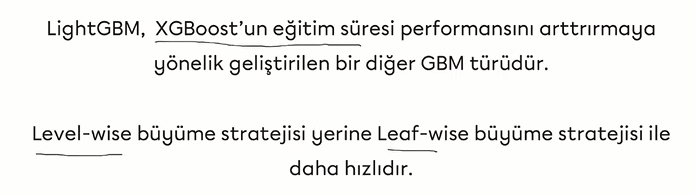

In [ ]:
#catboost

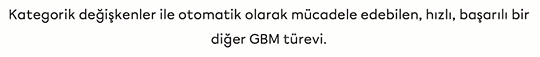

In [ ]:
catboost_model=CatBoostClassifier(random_state=17,verbose=False)

In [ ]:
catboost_cv=cross_validate(catboost_model,X,y,cv=2,scoring=["accuracy","f1","roc_auc"])

In [ ]:
print(catboost_cv["test_accuracy"].mean())
print(catboost_cv["test_f1"].mean())
print(catboost_cv["test_roc_auc"].mean())

0.7578125
0.6209462164687042
0.8384776119402986


In [ ]:
catboost_model.get_params()

{'verbose': False, 'random_state': 17}

In [ ]:
catboost_params={
    "iterations" : [200,500],
    "learning_rate" :[0.01,0.1],
    "depth" : [3,6]
}

In [ ]:
catboost_grid=GridSearchCV(catboost_model,catboost_params,cv=5,n_jobs=-1,verbose=False).fit(X,y)

In [ ]:
catboost_grid.best_params_

{'depth': 3, 'iterations': 500, 'learning_rate': 0.01}

In [ ]:
catboost_final=catboost_model.set_params(**catboost_grid.best_params_,random_state=17,verbose=False).fit(X,y)

In [ ]:
final_cv=cross_validate(catboost_final,X,y,cv=5,scoring=["accuracy","f1","roc_auc"])
print(final_cv["test_accuracy"].mean())
print(final_cv["test_f1"].mean())
print(final_cv["test_roc_auc"].mean())

0.7721755368814192
0.6322580676028952
0.842001397624039


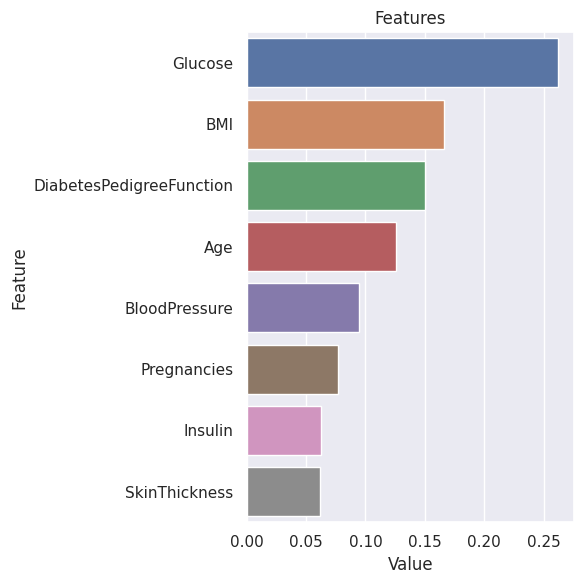

In [ ]:
#feature importance
def plot_importance(model,features,num=len(X),save=False):
    feature_imp=pd.DataFrame({"Value":model.feature_importances_,"Feature":features.columns})
    plt.figure(figsize=(6,6))
    sns.set(font_scale=1)
    sns.barplot(x="Value",y="Feature",data=feature_imp.sort_values(by="Value",ascending=False)[0:num])

    plt.title("Features")
    plt.tight_layout()
    plt.show()


plot_importance(gbm_final,X)

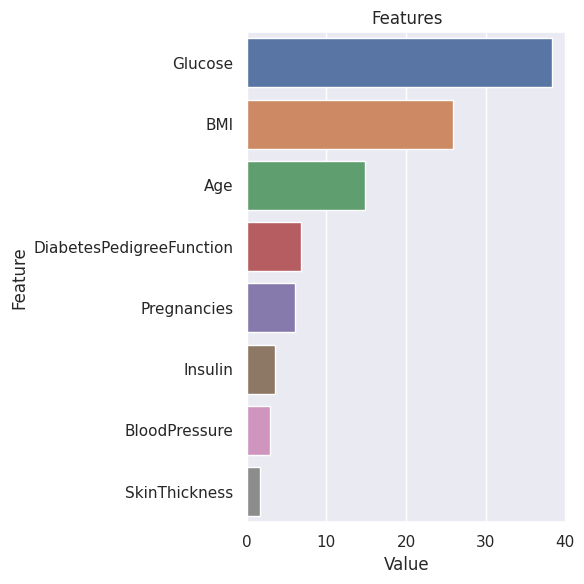

In [ ]:
plot_importance(catboost_final,X)

In [ ]:
#RandomSearchCV
rf_model=RandomForestClassifier(random_state=17)

rf_random_params={
    "max_depth":np.random.randint(5,50,10),
    "max_features" : [3,5,7,"auto","sqrt"],
    "min_samples_split" : np.random.randint(2,50,20),
    "n_estimators" : [int(x) for x in np.linspace(start=200,stop=1500,num=10)]
}

In [ ]:
rf_random=RandomizedSearchCV(estimator=rf_model,
                             param_distributions=rf_random_params,
                             n_iter=100,#denenecek parametre sayısı --yani oluşacak kombinasyonlardan seçilen
                             cv=3,
                             verbose=True,
                             random_state=17,
                             n_jobs=-1)

In [ ]:
rf_random.fit(X,y)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(random_state=17),
                   n_iter=100, n_jobs=-1,
                   param_distributions={'max_depth': array([36, 27,  9, 40, 45, 49, 12,  7, 43, 38]),
                                        'max_features': [3, 5, 7, 'auto',
                                                         'sqrt'],
                                        'min_samples_split': array([48,  8, 11, 43, 31, 15, 10, 18, 46, 41,  2,  4, 42, 10, 32, 18, 42,
       22, 12, 27]),
                                        'n_estimators': [200, 344, 488, 633,
                                                         777, 922, 1066, 1211,
                                                         1355, 1500]},
                   random_state=17, verbose=True)

In [ ]:
rf_random.best_params_

{'n_estimators': 1066,
 'min_samples_split': 11,
 'max_features': 'sqrt',
 'max_depth': 9}

In [ ]:
rf_final=rf_model.set_params(**rf_random.best_params_,random_state=17).fit(X,y)

In [ ]:
final_cv=cross_validate(rf_random,X,y,cv=5,scoring=["accuracy","f1","roc_auc"])
print(final_cv["test_accuracy"].mean())
print(final_cv["test_f1"].mean())
print(final_cv["test_roc_auc"].mean())

Fitting 3 folds for each of 100 candidates, totalling 300 fits


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits
0.7696205755029285
0.6346109582456142
0.8332816212438854


In [ ]:
#model karmaşıklığı
def val_curve_params(model,X,y,param_name,param_range,scoring="roc_auc",cv=100) :
    train_score,test_score=validation_curve(
        model,X=X,y=y,param_name=param_name,param_range=param_range,scoring=scoring,cv=cv
    )

    mean_train_score=np.mean(train_score,axis=1)
    mean_test_score=np.mean(test_score,axis=1)

    plt.plot(param_range,mean_train_score,
             label="Training Score",color="b")

    plt.plot(param_range,mean_test_score,
             label="Validation Score",color="g")

    plt.title(f"Validation Curve for {type(model).__name__}")
    plt.xlabel(f"Number of {param_name}")
    plt.ylabel(f"{scoring}")
    plt.tight_layout()
    plt.legend(loc="best")
    plt.show(block=True)

In [ ]:
rf_val_params=[["max_depth",[5,8,15,20,30,None]],
               ["max_features",[3,5,7,"auto"]],
               ["min_samples_split",[2,5,8,15,20]],
               ["n_estimators",[10,50,100,200,500]]]

In [ ]:
rf_model=RandomForestClassifier(random_state=17)

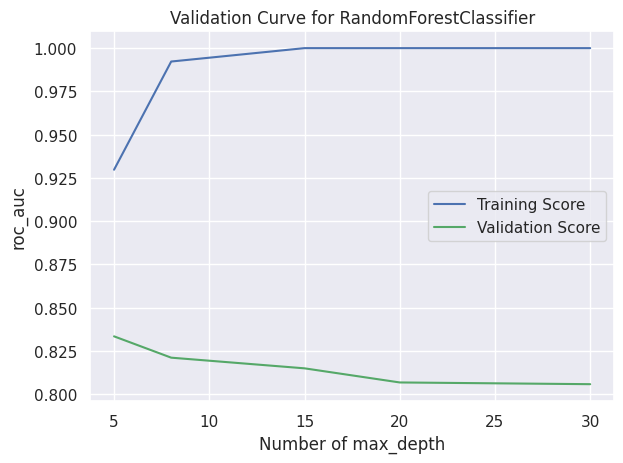

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

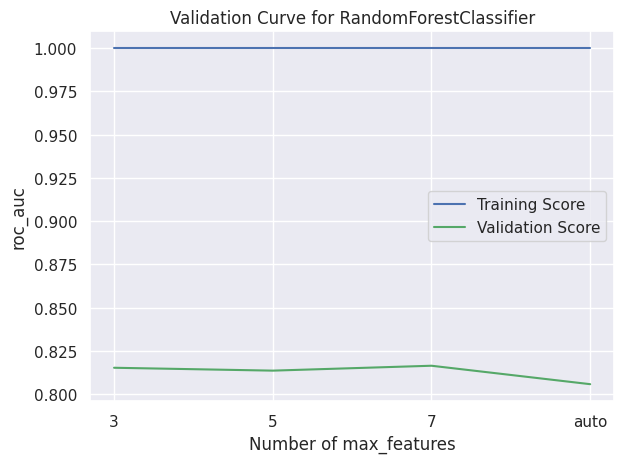

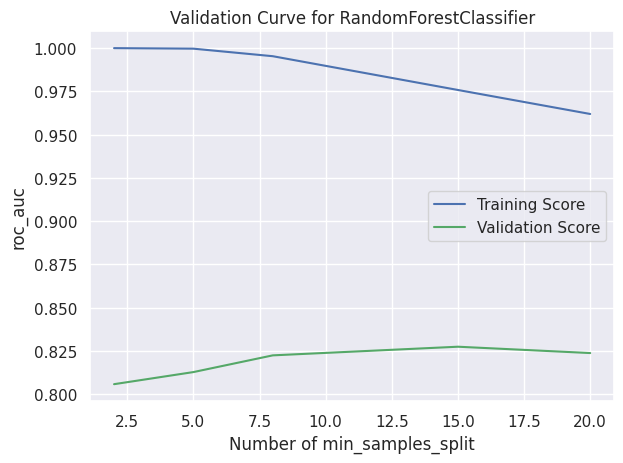

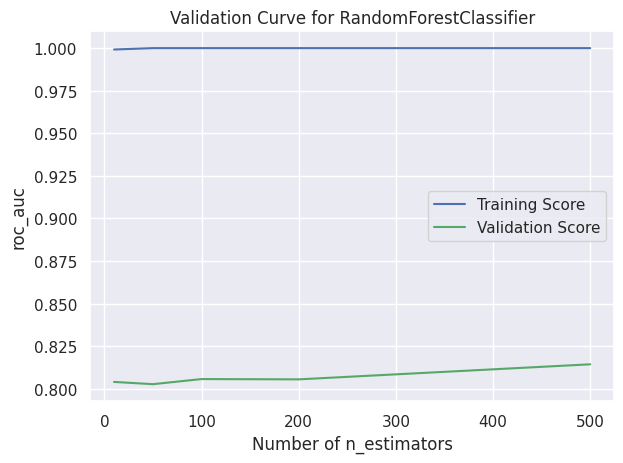

[5, 8, 15, 20, 30, None]

In [ ]:
for i in range(len(rf_val_params)):
  val_curve_params(rf_model,X,y,rf_val_params[i][0],rf_val_params[i][1])

rf_val_params[0][1]

# Denetimsiz Öğrenme

In [ ]:
#K ortalama ,Hiyerarşik Kümeleme

In [ ]:
"""
1- Küme sayısı belirlenir.
2-Rastgele k merkez seçilir
3-Her bir gözlemin k merkezlerine uzaklıkları hesaplanır.
4-en yakın olduğu merkeze yani kümeye atanır.
5-atama işlemlerinden sonra oluşan kümeler için tekrar merkez hesabı yapılır.
6-Bu işlem belirlenen bir iterasyon adedince tekrar edilir ve küme içi hata kareler
toplamlarının toplamının (total within-cluster variation) minimum olduğu durumdaki
gözlemlerin kümelenme yapısı nihai kümelenme olarak seçilir.
"""

'\n1- Küme sayısı belirlenir.\n2-Rastgele k merkez seçilir\n3-Her bir gözlemin k merkezlerine uzaklıkları hesaplanır.\n4-en yakın olduğu merkeze yani kümeye atanır.\n5-atama işlemlerinden sonra oluşan kümeler için tekrar merkez hesabı yapılır.\n6-Bu işlem belirlenen bir iterasyon adedince tekrar edilir ve küme içi hata kareler\ntoplamlarının toplamının (total within-cluster variation) minimum olduğu durumdaki\ngözlemlerin kümelenme yapısı nihai kümelenme olarak seçilir.\n'

In [ ]:
!pip install yellowbrick

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split,cross_validate,GridSearchCV,RandomizedSearchCV
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from yellowbrick.cluster import kelbow_visualizer
from sklearn.decomposition import PCA

from scipy.cluster.hierarchy import linkage,dendrogram

In [ ]:
df=pd.read_csv("USArrests.csv",index_col=0)
df.head()

,Murder,Assault,UrbanPop,Rape
Alabama,13.2,236,58,21.2
Alaska,10.0,263,48,44.5
Arizona,8.1,294,80,31.0
Arkansas,8.8,190,50,19.5
California,9.0,276,91,40.6


In [ ]:
df.isnull().sum()

Murder      0
Assault     0
UrbanPop    0
Rape        0
dtype: int64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 50 entries, Alabama to Wyoming
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Murder    50 non-null     float64
 1   Assault   50 non-null     int64  
 2   UrbanPop  50 non-null     int64  
 3   Rape      50 non-null     float64
dtypes: float64(2), int64(2)
memory usage: 2.0+ KB


In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Murder,50.0,7.788,4.355510,0.8,4.075,7.25,11.250,17.4
Assault,50.0,170.760,83.337661,45.0,109.000,159.00,249.000,337.0
UrbanPop,50.0,65.540,14.474763,32.0,54.500,66.00,77.750,91.0
Rape,50.0,21.232,9.366385,7.3,15.075,20.10,26.175,46.0


In [ ]:
data=MinMaxScaler((0,1)).fit_transform(df)
data[0:5]

array([[0.74698795, 0.65410959, 0.44067797, 0.35917313],
       [0.55421687, 0.74657534, 0.27118644, 0.96124031],
       [0.43975904, 0.85273973, 0.81355932, 0.6124031 ],
       [0.48192771, 0.49657534, 0.30508475, 0.31524548],
       [0.4939759 , 0.79109589, 1.        , 0.86046512]])

In [ ]:
kmeans=KMeans(n_clusters=4,random_state=17).fit(df)
kmeans.get_params()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


{'algorithm': 'lloyd',
 'copy_x': True,
 'init': 'k-means++',
 'max_iter': 300,
 'n_clusters': 4,
 'n_init': 'warn',
 'random_state': 17,
 'tol': 0.0001,
 'verbose': 0}

In [ ]:
kmeans.n_clusters

4

In [ ]:
kmeans.cluster_centers_

array([[  5.59      , 112.4       ,  65.6       ,  17.27      ],
       [ 11.8125    , 272.5625    ,  68.3125    ,  28.375     ],
       [  8.21428571, 173.28571429,  70.64285714,  22.84285714],
       [  2.95      ,  62.7       ,  53.9       ,  11.51      ]])

In [ ]:
kmeans.labels_

array([1, 1, 1, 2, 1, 2, 0, 1, 1, 2, 3, 0, 1, 0, 3, 0, 0, 1, 3, 1, 2, 1,
       3, 1, 2, 0, 0, 1, 3, 2, 1, 1, 1, 3, 0, 2, 2, 0, 2, 1, 3, 2, 2, 0,
       3, 2, 2, 3, 3, 2], dtype=int32)

In [ ]:
kmeans.inertia_

34728.629357142854

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

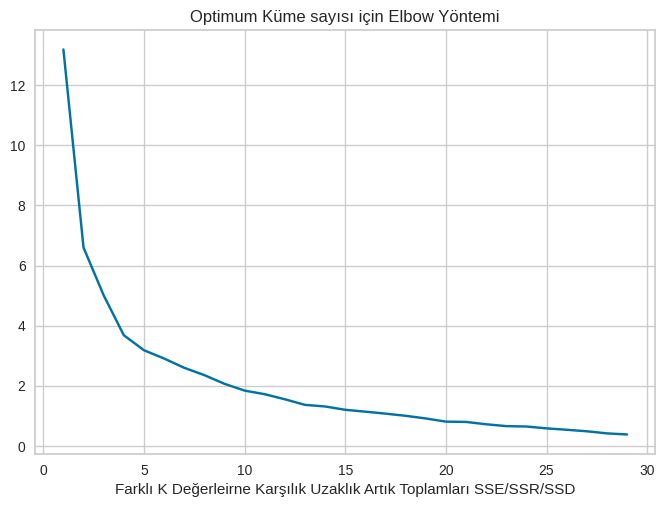

In [ ]:
#optimum küme sayısı belirleme
kmeans=KMeans()
ssd=[]
K=range(1,30)
for k in K:
  kmeans=KMeans(n_clusters=k).fit(data)
  ssd.append(kmeans.inertia_)

plt.plot(K,ssd,"bx-")
plt.xlabel("Farklı K Değerleirne Karşılık Uzaklık Artık Toplamları SSE/SSR/SSD")
plt.title("Optimum Küme sayısı için Elbow Yöntemi")
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

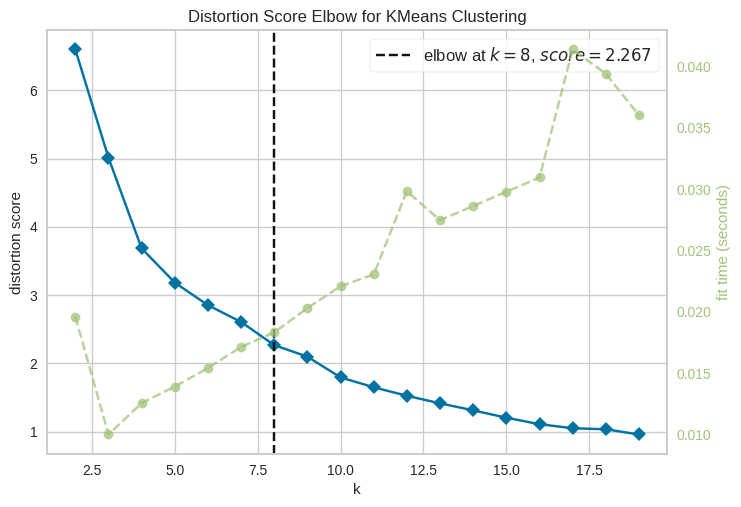

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
from yellowbrick.cluster import KElbowVisualizer
kmeans=KMeans()
elbow=KElbowVisualizer(kmeans,k=(2,20))
elbow.fit(data)
elbow.show()

In [ ]:
elbow.elbow_value_

8

In [ ]:
kmeans=KMeans(n_clusters=elbow.elbow_value_).fit(data)

kmeans.n_clusters
kmeans.cluster_centers_
kmeans.labels_
data[0:5]

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


array([[0.74698795, 0.65410959, 0.44067797, 0.35917313],
       [0.55421687, 0.74657534, 0.27118644, 0.96124031],
       [0.43975904, 0.85273973, 0.81355932, 0.6124031 ],
       [0.48192771, 0.49657534, 0.30508475, 0.31524548],
       [0.4939759 , 0.79109589, 1.        , 0.86046512]])

In [ ]:
clusters=kmeans.labels_
df["cluster"]=clusters
df.head()

,Murder,Assault,UrbanPop,Rape,cluster
Alabama,13.2,236,58,21.2,6
Alaska,10.0,263,48,44.5,7
Arizona,8.1,294,80,31.0,2
Arkansas,8.8,190,50,19.5,1
California,9.0,276,91,40.6,0


In [ ]:
df[df["cluster"]==4]

,Murder,Assault,UrbanPop,Rape,cluster
Connecticut,3.3,110,77,11.1,4
Hawaii,5.3,46,83,20.2,4
Massachusetts,4.4,149,85,16.3,4
New Jersey,7.4,159,89,18.8,4
Rhode Island,3.4,174,87,8.3,4
Utah,3.2,120,80,22.9,4


In [ ]:
df.groupby("cluster").agg(["count","mean","median"])

Murder                   Assault                    UrbanPop  \
         count       mean median   count        mean median    count   
cluster                                                                
0            3   9.700000   9.00       3  244.000000  252.0        3   
1           11   6.918182   6.60      11  140.909091  115.0       11   
2            8  11.562500  11.35       8  271.625000  270.0        8   
3           10   2.680000   2.40      10   70.100000   64.5       10   
4            6   4.500000   3.90       6  126.333333  134.5        6   
5            4   6.300000   6.10       4  150.500000  152.0        4   
6            7  14.671429  14.40       7  251.285714  249.0        7   
7            1  10.000000  10.00       1  263.000000  263.0        1   

                           Rape                    
              mean median count       mean median  
cluster                                            
0        83.333333   81.0     3  41.766667  40.60  
1        62.090909   63.0    11  17.700000  16.50  
2        77.500000   80.0     8  29.187500  29.40  
3        51.000000   52.5    10  10.910000  11.00  
4        83.500000   84.0     6  16.266667  17.55  
5        71.250000   71.5     4  26.275000  27.20  
6        54.285714   58.0     7  21.685714  22.20  
7        48.000000   48.0     1  44.500000  44.50

In [ ]:
#Hiyerarşik Kümeleme Analizi
"""
a)birleştirici -- b)bölümleyici
k means küme dışardan müdahale edemiyorduk.Burada örnek olarak "şu eyalet tek
başına dışarıda kalmış buraya taşıyalım vs."
"""

'\na)birleştirici -- b)bölümleyici\nk means küme dışardan müdahale edemiyorduk.Burada örnek olarak "şu eyalet tek\nbaşına dışarıda kalmış buraya taşıyalım vs."\n'

In [ ]:
df_2=pd.read_csv("/content/USArrests.csv",index_col=0)

In [ ]:
df3=MinMaxScaler((0,1)).fit_transform(df_2)
df3[0:1]

array([[0.74698795, 0.65410959, 0.44067797, 0.35917313]])

In [ ]:
hc_average=linkage(df3,"average")

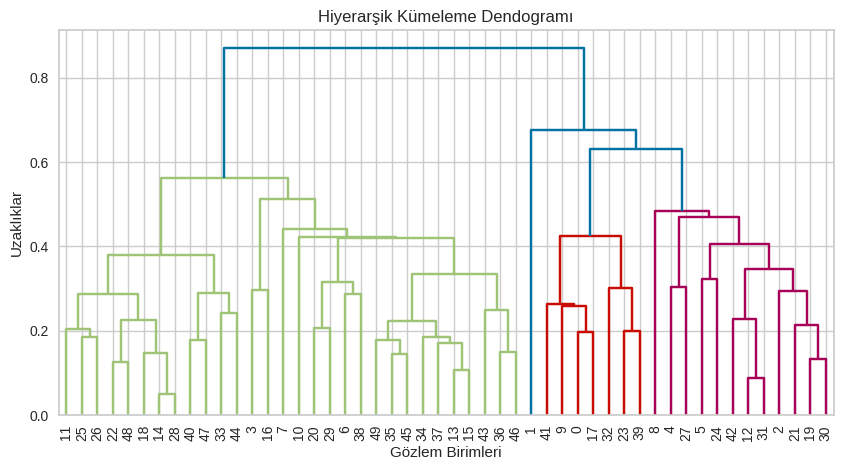

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Hiyerarşik Kümeleme Dendogramı")
plt.xlabel("Gözlem Birimleri")
plt.ylabel("Uzaklıklar")
dendrogram(hc_average,
          leaf_font_size=10)

plt.show()

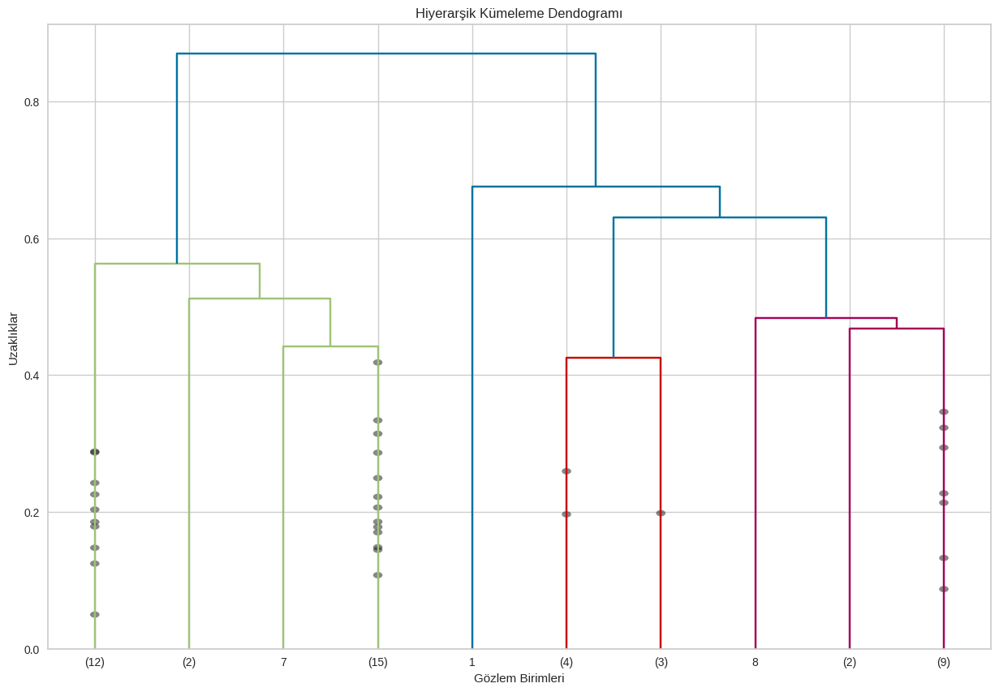

In [ ]:
plt.figure(figsize=(15,10))
plt.title("Hiyerarşik Kümeleme Dendogramı")
plt.xlabel("Gözlem Birimleri")
plt.ylabel("Uzaklıklar")
dendrogram(hc_average,
           truncate_mode="lastp",
           p=10,
           show_contracted=True,
          leaf_font_size=10)

plt.show()

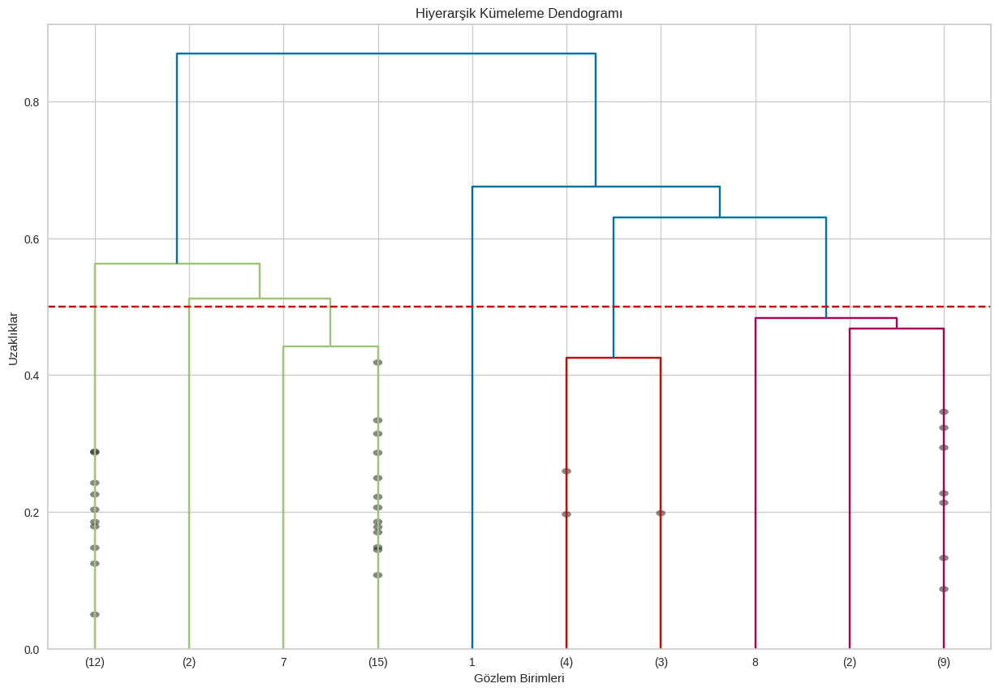

In [ ]:
#küme sayısını belirleme
plt.figure(figsize=(15,10))
plt.title("Hiyerarşik Kümeleme Dendogramı")
plt.xlabel("Gözlem Birimleri")
plt.ylabel("Uzaklıklar")
dendrogram(hc_average,
           truncate_mode="lastp",
           p=10,
           show_contracted=True,
          leaf_font_size=10)
plt.axhline(y=0.5,color="r",linestyle="--")
plt.show()

In [ ]:
from sklearn.cluster import AgglomerativeClustering

In [ ]:
cluster=AgglomerativeClustering(n_clusters=5,linkage="average")
clusters=cluster.fit_predict(df3)

In [ ]:
df_2["hi_cluster_no"]=clusters
df_2["hi_cluster_no"]=df_2["hi_cluster_no"] #--> +1 olayı kozmetik.

In [ ]:
df_2.head()

,Murder,Assault,UrbanPop,Rape,hi_cluster_no
Alabama,13.2,236,58,21.2,3
Alaska,10.0,263,48,44.5,2
Arizona,8.1,294,80,31.0,1
Arkansas,8.8,190,50,19.5,0
California,9.0,276,91,40.6,1


In [ ]:
df.head()

,Murder,Assault,UrbanPop,Rape,cluster
Alabama,13.2,236,58,21.2,6
Alaska,10.0,263,48,44.5,7
Arizona,8.1,294,80,31.0,2
Arkansas,8.8,190,50,19.5,1
California,9.0,276,91,40.6,0


In [ ]:
data_merged=df.merge(df_2,how="left")
data_merged.head()

,Murder,Assault,UrbanPop,Rape,cluster,hi_cluster_no
0,13.2,236,58,21.2,6,3
1,10.0,263,48,44.5,7,2
2,8.1,294,80,31.0,2,1
3,8.8,190,50,19.5,1,0
4,9.0,276,91,40.6,0,1


In [ ]:
#Temel Bileşen Analizi
"""
Temel fikir,çok değişkenli verinin ana özelliklerini daha az sayıda
değişken/bileşen ile temsil etmektir.

Küçük miktarda bir bilgi kaybını göze alıp değişken boyutunu azaltmaktır.
"""

'\nTemel fikir,çok değişkenli verinin ana özelliklerini daha az sayıda\ndeğişken/bileşen ile temsil etmektir.\n\nKüçük miktarda bir bilgi kaybını göze alıp değişken boyutunu azaltmaktır.\n'

In [ ]:
#3D --> 2D (değişken grupları arasında korelasyon yoktur.) varyansa dayalı gruplama yapılmaktadır.

In [ ]:
df=pd.read_csv("hitters.csv")
df.head()

,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,League,Division,PutOuts,Assists,Errors,Salary,NewLeague
0,293,66,1,30,29,14,1,293,66,1,30,29,14,A,E,446,33,20,NaN,A
1,315,81,7,24,38,39,14,3449,835,69,321,414,375,N,W,632,43,10,475.0,N
2,479,130,18,66,72,76,3,1624,457,63,224,266,263,A,W,880,82,14,480.0,A
3,496,141,20,65,78,37,11,5628,1575,225,828,838,354,N,E,200,11,3,500.0,N
4,321,87,10,39,42,30,2,396,101,12,48,46,33,N,E,805,40,4,91.5,N


In [ ]:
df.isnull().sum()

AtBat         0
Hits          0
HmRun         0
Runs          0
RBI           0
Walks         0
Years         0
CAtBat        0
CHits         0
CHmRun        0
CRuns         0
CRBI          0
CWalks        0
League        0
Division      0
PutOuts       0
Assists       0
Errors        0
Salary       59
NewLeague     0
dtype: int64

In [ ]:
df.isnull().sum()

AtBat         0
Hits          0
HmRun         0
Runs          0
RBI           0
Walks         0
Years         0
CAtBat        0
CHits         0
CHmRun        0
CRuns         0
CRBI          0
CWalks        0
League        0
Division      0
PutOuts       0
Assists       0
Errors        0
Salary       59
NewLeague     0
dtype: int64

In [ ]:
#df=df.drop("Salary",axis=1)

In [ ]:
num_cols=[col for col in df.columns if df[col].dtypes!= "object" and "Salary" not in col]
df[num_cols].head()

,AtBat,Hits,HmRun,Runs,RBI,Walks,Years,CAtBat,CHits,CHmRun,CRuns,CRBI,CWalks,PutOuts,Assists,Errors
0,293,66,1,30,29,14,1,293,66,1,30,29,14,446,33,20
1,315,81,7,24,38,39,14,3449,835,69,321,414,375,632,43,10
2,479,130,18,66,72,76,3,1624,457,63,224,266,263,880,82,14
3,496,141,20,65,78,37,11,5628,1575,225,828,838,354,200,11,3
4,321,87,10,39,42,30,2,396,101,12,48,46,33,805,40,4


In [ ]:
df=df[num_cols]
df.dropna(inplace=True)
df.shape

(322, 16)

In [ ]:
"""for column in df.columns:
    if df[column].dtype == 'object':
        df = df.drop(columns=[column])"""

"for column in df.columns:\n    if df[column].dtype == 'object':\n        df = df.drop(columns=[column])"

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 322 entries, 0 to 321
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype
---  ------   --------------  -----
 0   AtBat    322 non-null    int64
 1   Hits     322 non-null    int64
 2   HmRun    322 non-null    int64
 3   Runs     322 non-null    int64
 4   RBI      322 non-null    int64
 5   Walks    322 non-null    int64
 6   Years    322 non-null    int64
 7   CAtBat   322 non-null    int64
 8   CHits    322 non-null    int64
 9   CHmRun   322 non-null    int64
 10  CRuns    322 non-null    int64
 11  CRBI     322 non-null    int64
 12  CWalks   322 non-null    int64
 13  PutOuts  322 non-null    int64
 14  Assists  322 non-null    int64
 15  Errors   322 non-null    int64
dtypes: int64(16)
memory usage: 40.4 KB


In [ ]:
df=StandardScaler().fit_transform(df)

pca=PCA()
pca_fit=pca.fit_transform(df)

pca.explained_variance_ratio_ #açıkladıkları varyans oranı
np.cumsum(pca.explained_variance_ratio_)

array([0.46037855, 0.72077704, 0.82416565, 0.87785586, 0.91993427,
       0.94957018, 0.96527809, 0.9766709 , 0.9845032 , 0.9903799 ,
       0.99412755, 0.99722139, 0.99877819, 0.99963722, 0.99992409,
       1.        ])

In [ ]:
"""
1. değişken = 0.46037855
1. değişken + 2. değişken =0.72077704
.
.
.
1.değ + .....+ 16. değ = 1
"""

'\n1. değişken = 0.46037855\n1. değişken + 2. değişken =0.72077704\n.\n.\n.\n1.değ + .....+ 16. değ = 1\n'

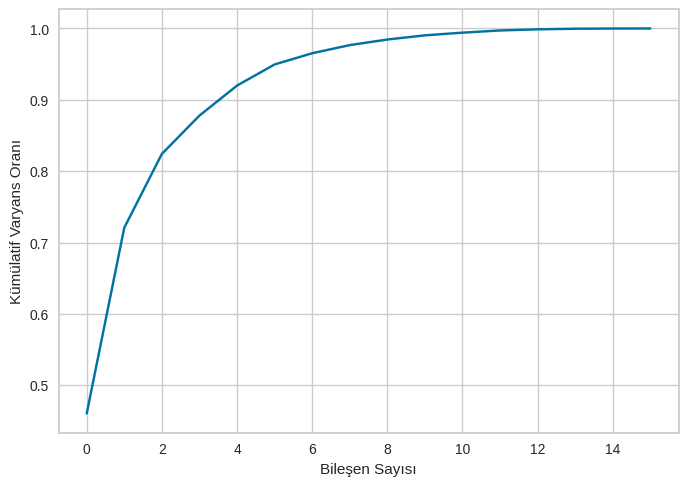

In [ ]:
pca=PCA().fit(df)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel("Bileşen Sayısı")
plt.ylabel("Kümülatif Varyans Oranı")
plt.show()

In [ ]:
pca=PCA(n_components=3)
model=pca.fit_transform(df)

In [ ]:
pca.explained_variance_ratio_ #açıkladıkları varyans oranı
np.cumsum(pca.explained_variance_ratio_)

array([0.46037855, 0.72077704, 0.82416565])

In [ ]:
#Pirincipal Component Regression -- Temel Bileşin Regresyonu
df=pd.read_csv("hitters.csv")
df.shape

(322, 20)

In [ ]:
len(model)

322

In [ ]:
num_cols=[col for col in df.columns if df[col].dtypes!="object" and "Salary" not in col]
len(num_cols)

16

In [ ]:
others=[col for col in df.columns if col not in num_cols]
others

['League', 'Division', 'Salary', 'NewLeague']

In [ ]:
pd.DataFrame(model,columns=["PC1","PC2","PC3"]).head()

,PC1,PC2,PC3
0,-3.240106,-0.253173,0.776066
1,0.245488,1.302951,0.118040
2,0.603883,-2.617002,-0.698183
3,3.591276,0.547821,-1.049022
4,-2.264528,-0.698898,-1.290536


In [ ]:
df[others].head()

,League,Division,Salary,NewLeague
0,A,E,NaN,A
1,N,W,475.0,N
2,A,W,480.0,A
3,N,E,500.0,N
4,N,E,91.5,N


In [ ]:
final_df=pd.concat([pd.DataFrame(model,columns=["PC1","PC2","PC3"]),df[others]],axis=1)

In [ ]:
final_df.head()

,PC1,PC2,PC3,League,Division,Salary,NewLeague
0,-3.240106,-0.253173,0.776066,A,E,NaN,A
1,0.245488,1.302951,0.118040,N,W,475.0,N
2,0.603883,-2.617002,-0.698183,A,W,480.0,A
3,3.591276,0.547821,-1.049022,N,E,500.0,N
4,-2.264528,-0.698898,-1.290536,N,E,91.5,N


In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import LabelEncoder

In [ ]:
def label_encoder(dataframe,binary_col):
  labelencoder=LabelEncoder()
  dataframe[binary_col]=labelencoder.fit_transform(dataframe[binary_col])
  return dataframe

In [ ]:
for col in ["NewLeague","Division","League"]:
  label_encoder(final_df,col)

In [ ]:
final_df.dropna(inplace=True)

In [ ]:
y=final_df["Salary"]
X=final_df.drop("Salary",axis=1)

In [ ]:
from sklearn.model_selection import cross_val_score

In [ ]:
lm=LinearRegression()
rmse=np.mean(np.sqrt(-cross_val_score(lm,X,y,cv=3,scoring="neg_mean_squared_error")))

In [ ]:
rmse

339.6929767825363

In [ ]:
y.mean()

535.9258821292775

In [ ]:
cart=DecisionTreeRegressor()
rmse2=np.mean(np.sqrt(-cross_val_score(cart,X,y,cv=3,scoring="neg_mean_squared_error")))

In [ ]:
rmse2

390.2901931618005

In [ ]:
from sklearn.model_selection import GridSearchCV

In [ ]:
cart_params={"max_depth":range(1,11),
             "min_samples_split":range(2,20)}

In [ ]:
grid=GridSearchCV(cart,
                  cart_params,
                  cv=5,
                  n_jobs=-1,
                  verbose=True).fit(X,y)

Fitting 5 folds for each of 180 candidates, totalling 900 fits


In [ ]:
cart_final=DecisionTreeRegressor(**grid.best_params_,random_state=17).fit(X,y)

In [ ]:
rmse=np.mean(np.sqrt(-cross_val_score(cart_final,X,y,cv=5,scoring="neg_mean_squared_error")))
rmse

330.1964109339104

In [ ]:
#pca görselleştirme
pd.set_option("display.max_columns",None)
pd.set_option("display.width",500)

df=pd.read_csv("breast_cancer.csv")

In [ ]:
df.head(3)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.8,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.6,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.9,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.8,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.0,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.5,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758


In [ ]:
y=df["diagnosis"]
X=df.drop(["diagnosis","id"],axis=1)

In [ ]:
def create_pca_df(X,y):
  X=StandardScaler().fit_transform(X)
  pca=PCA(n_components=2)
  pca_fit=pca.fit_transform(X)
  pca_df=pd.DataFrame(data=pca_fit,columns=["PC1","PC2"])
  final_df=pd.concat([pca_df,pd.DataFrame(y)],axis=1)
  return final_df

In [ ]:
pca_df=create_pca_df(X,y)
pca_df

,PC1,PC2,diagnosis
0,9.192837,1.948583,M
1,2.387802,-3.768172,M
2,5.733896,-1.075174,M
3,7.122953,10.275589,M
4,3.935302,-1.948072,M
...,...,...,...
564,6.439315,-3.576817,M
565,3.793382,-3.584048,M
566,1.256179,-1.902297,M
567,10.374794,1.672010,M


In [ ]:
import random

In [ ]:
def plot_pca(dataframe,target):
  fig=plt.figure(figsize=(7,5))
  ax=fig.add_subplot(1,1,1)
  ax.set_xlabel("PC1",fontsize=15)
  ax.set_ylabel("PC2",fontsize=15)
  ax.set_title(f"{target.capitalize()}",fontsize=20)

  targets=list(dataframe[target].unique())#kaç tane eşsiz sınıf var.
  colors=random.sample(["r","b","g","y"],len(targets))

  for t,color in zip(targets,colors):
    indices=dataframe[target] == t
    ax.scatter(dataframe.loc[indices,"PC1"],dataframe.loc[indices,"PC2"],c=color,s=50)
  ax.legend(targets)
  ax.grid()
  plt.show()

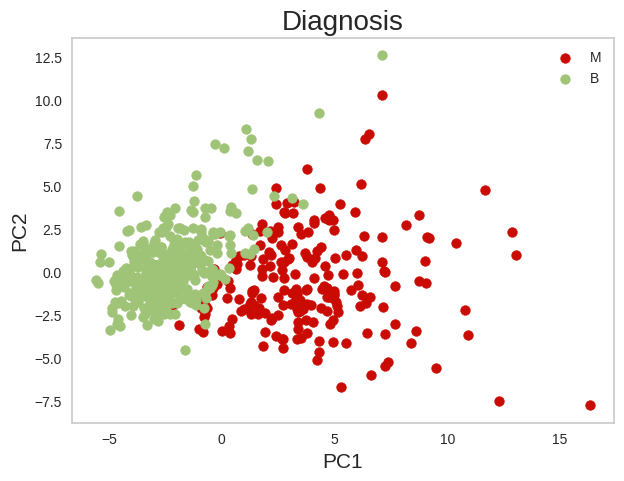

In [ ]:
plot_pca(pca_df,"diagnosis")

# ML Süreç

In [38]:
import joblib
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt

from sklearn.preprocessing import LabelEncoder,OneHotEncoder,StandardScaler
from sklearn.model_selection import train_test_split,cross_validate,GridSearchCV

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier
from sklearn.ensemble import VotingClassifier,AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

In [53]:
"""
1-research
2-pipeline:2 -->oluşturulan fonksiyonların tamamen 1 fonksiyona çevrilmesi.(otomizasyon)
3-pipeline 3 :prediction -->kayıt edilen modelin tahminleme için kullanılması

"""

'\n1-research \n2-pipeline:2 -->oluşturulan fonksiyonların tamamen 1 fonksiyona çevrilmesi.(otomizasyon)\n3-pipeline 3 :prediction -->kayıt edilen modelin tahminleme için kullanılması\n\n'

# Research

In [2]:
pd.set_option("display.max_columns",None)
pd.set_option("display.width",500)

In [3]:
###################################
#1. Exploratory Data Analysis
###################################

In [4]:
def check_df(dataframe, head=5):
    print("##################### Shape #####################")
    print(dataframe.shape)
    print("##################### Types #####################")
    print(dataframe.dtypes)
    print("##################### Head #####################")
    print(dataframe.head(head))
    print("##################### Tail #####################")
    print(dataframe.tail(head))
    print("##################### NA #####################")
    print(dataframe.isnull().sum())
    print("##################### Quantiles #####################")
    print(dataframe.quantile([0, 0.05, 0.50, 0.95, 0.99, 1]).T)

def cat_summary(dataframe, col_name, plot=False):
    print(pd.DataFrame({col_name: dataframe[col_name].value_counts(),
                        "Ratio": 100 * dataframe[col_name].value_counts() / len(dataframe)}))
    print("##########################################")
    if plot:
        sns.countplot(x=dataframe[col_name], data=dataframe)
        plt.show(block=True)

def num_summary(dataframe, numerical_col, plot=False):
    quantiles = [0.05, 0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 0.95, 0.99]
    print(dataframe[numerical_col].describe(quantiles).T)

    if plot:
        dataframe[numerical_col].hist(bins=20)
        plt.xlabel(numerical_col)
        plt.title(numerical_col)
        plt.show(block=True)

def target_summary_with_num(dataframe, target, numerical_col):
    print(dataframe.groupby(target).agg({numerical_col: "mean"}), end="\n\n\n")

def target_summary_with_cat(dataframe, target, categorical_col):
    print(pd.DataFrame({"TARGET_MEAN": dataframe.groupby(categorical_col)[target].mean()}), end="\n\n\n")

def correlation_matrix(df, cols):
    fig = plt.gcf()
    fig.set_size_inches(10, 8)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    fig = sns.heatmap(df[cols].corr(), annot=True, linewidths=0.5, annot_kws={'size': 12}, linecolor='w', cmap='RdBu')
    plt.show(block=True)

def grab_col_names(dataframe, cat_th=10, car_th=20):
    """

    Veri setindeki kategorik, numerik ve kategorik fakat kardinal değişkenlerin isimlerini verir.
    Not: Kategorik değişkenlerin içerisine numerik görünümlü kategorik değişkenler de dahildir.

    Parameters
    ------
        dataframe: dataframe
                Değişken isimleri alınmak istenilen dataframe
        cat_th: int, optional
                numerik fakat kategorik olan değişkenler için sınıf eşik değeri
        car_th: int, optinal
                kategorik fakat kardinal değişkenler için sınıf eşik değeri

    Returns
    ------
        cat_cols: list
                Kategorik değişken listesi
        num_cols: list
                Numerik değişken listesi
        cat_but_car: list
                Kategorik görünümlü kardinal değişken listesi

    Examples
    ------
        import seaborn as sns
        df = sns.load_dataset("iris")
        print(grab_col_names(df))


    Notes
    ------
        cat_cols + num_cols + cat_but_car = toplam değişken sayısı
        num_but_cat cat_cols'un içerisinde.
        Return olan 3 liste toplamı toplam değişken sayısına eşittir: cat_cols + num_cols + cat_but_car = değişken sayısı

    """

    # cat_cols, cat_but_car
    cat_cols = [col for col in dataframe.columns if dataframe[col].dtypes == "O"]
    num_but_cat = [col for col in dataframe.columns if dataframe[col].nunique() < cat_th and
                   dataframe[col].dtypes != "O"]
    cat_but_car = [col for col in dataframe.columns if dataframe[col].nunique() > car_th and
                   dataframe[col].dtypes == "O"]
    cat_cols = cat_cols + num_but_cat
    cat_cols = [col for col in cat_cols if col not in cat_but_car]

    # num_cols
    num_cols = [col for col in dataframe.columns if dataframe[col].dtypes != "O"]
    num_cols = [col for col in num_cols if col not in num_but_cat]

    # print(f"Observations: {dataframe.shape[0]}")
    # print(f"Variables: {dataframe.shape[1]}")
    # print(f'cat_cols: {len(cat_cols)}')
    # print(f'num_cols: {len(num_cols)}')
    # print(f'cat_but_car: {len(cat_but_car)}')
    # print(f'num_but_cat: {len(num_but_cat)}')
    return cat_cols, num_cols, cat_but_car

In [5]:
df=pd.read_csv("diabetes.csv")
check_df(df)

##################### Shape #####################
(768, 9)
##################### Types #####################
Pregnancies                   int64
Glucose                       int64
BloodPressure                 int64
SkinThickness                 int64
Insulin                       int64
BMI                         float64
DiabetesPedigreeFunction    float64
Age                           int64
Outcome                       int64
dtype: object
##################### Head #####################
   Pregnancies  Glucose  BloodPressure  SkinThickness  Insulin   BMI  DiabetesPedigreeFunction  Age  Outcome
0            6      148             72             35        0  33.6                     0.627   50        1
1            1       85             66             29        0  26.6                     0.351   31        0
2            8      183             64              0        0  23.3                     0.672   32        1
3            1       89             66             23       94  28.1

In [6]:
cat_cols,num_cols,cat_but_car=grab_col_names(df,cat_th=5,car_th=20)
for col in cat_cols:
  cat_summary(df,col)

   Outcome      Ratio
0      500  65.104167
1      268  34.895833
##########################################


In [7]:
df[num_cols].describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,768.0,3.845052,3.369578,0.000,1.00000,3.0000,6.00000,17.00
Glucose,768.0,120.894531,31.972618,0.000,99.00000,117.0000,140.25000,199.00
BloodPressure,768.0,69.105469,19.355807,0.000,62.00000,72.0000,80.00000,122.00
SkinThickness,768.0,20.536458,15.952218,0.000,0.00000,23.0000,32.00000,99.00
Insulin,768.0,79.799479,115.244002,0.000,0.00000,30.5000,127.25000,846.00
BMI,768.0,31.992578,7.884160,0.000,27.30000,32.0000,36.60000,67.10
DiabetesPedigreeFunction,768.0,0.471876,0.331329,0.078,0.24375,0.3725,0.62625,2.42
Age,768.0,33.240885,11.760232,21.000,24.00000,29.0000,41.00000,81.00


count    768.000000
mean       3.845052
std        3.369578
min        0.000000
5%         0.000000
10%        0.000000
20%        1.000000
30%        1.000000
40%        2.000000
50%        3.000000
60%        4.000000
70%        5.000000
80%        7.000000
90%        9.000000
95%       10.000000
99%       13.000000
max       17.000000
Name: Pregnancies, dtype: float64


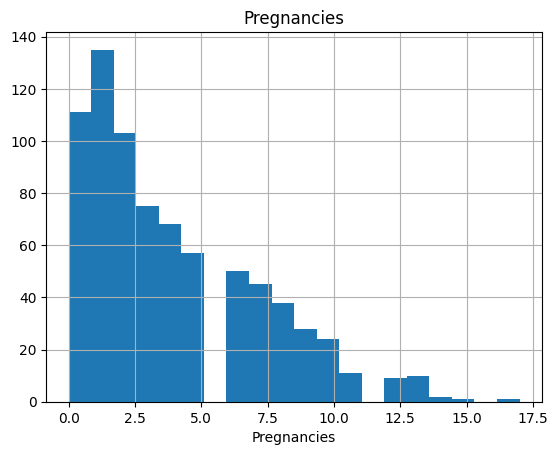

count    768.000000
mean     120.894531
std       31.972618
min        0.000000
5%        79.000000
10%       85.000000
20%       95.000000
30%      102.000000
40%      109.000000
50%      117.000000
60%      125.000000
70%      134.000000
80%      147.000000
90%      167.000000
95%      181.000000
99%      196.000000
max      199.000000
Name: Glucose, dtype: float64


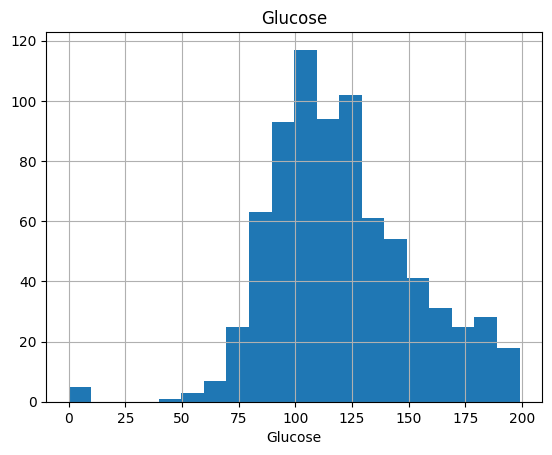

count    768.000000
mean      69.105469
std       19.355807
min        0.000000
5%        38.700000
10%       54.000000
20%       60.000000
30%       64.000000
40%       68.000000
50%       72.000000
60%       74.000000
70%       78.000000
80%       82.000000
90%       88.000000
95%       90.000000
99%      106.000000
max      122.000000
Name: BloodPressure, dtype: float64


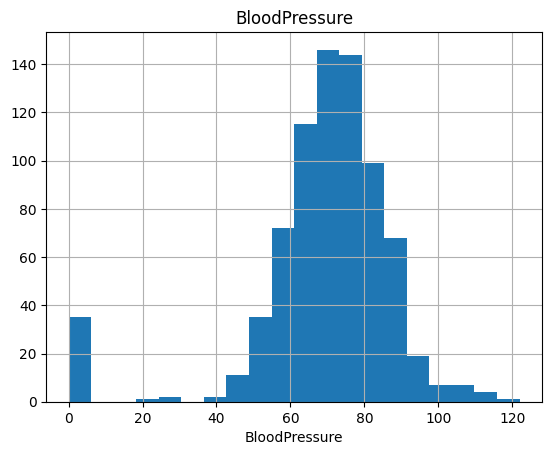

count    768.000000
mean      20.536458
std       15.952218
min        0.000000
5%         0.000000
10%        0.000000
20%        0.000000
30%        8.200000
40%       18.000000
50%       23.000000
60%       27.000000
70%       31.000000
80%       35.000000
90%       40.000000
95%       44.000000
99%       51.330000
max       99.000000
Name: SkinThickness, dtype: float64


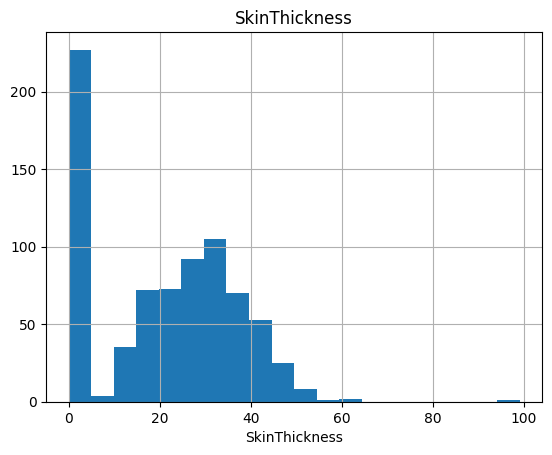

count    768.000000
mean      79.799479
std      115.244002
min        0.000000
5%         0.000000
10%        0.000000
20%        0.000000
30%        0.000000
40%        0.000000
50%       30.500000
60%       72.200000
70%      106.000000
80%      150.000000
90%      210.000000
95%      293.000000
99%      519.900000
max      846.000000
Name: Insulin, dtype: float64


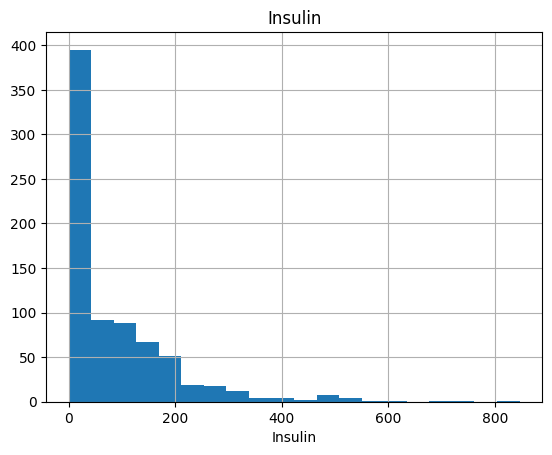

count    768.000000
mean      31.992578
std        7.884160
min        0.000000
5%        21.800000
10%       23.600000
20%       25.900000
30%       28.200000
40%       30.100000
50%       32.000000
60%       33.700000
70%       35.490000
80%       37.800000
90%       41.500000
95%       44.395000
99%       50.759000
max       67.100000
Name: BMI, dtype: float64


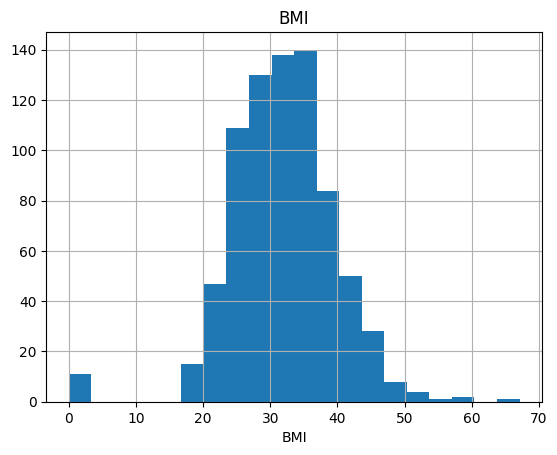

count    768.000000
mean       0.471876
std        0.331329
min        0.078000
5%         0.140350
10%        0.165000
20%        0.219400
30%        0.259000
40%        0.302800
50%        0.372500
60%        0.454200
70%        0.563700
80%        0.687000
90%        0.878600
95%        1.132850
99%        1.698330
max        2.420000
Name: DiabetesPedigreeFunction, dtype: float64


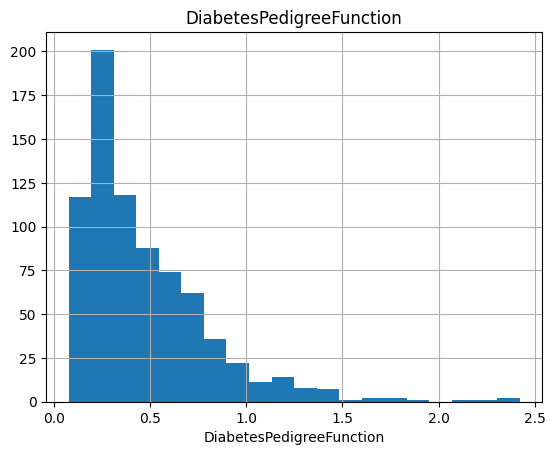

count    768.000000
mean      33.240885
std       11.760232
min       21.000000
5%        21.000000
10%       22.000000
20%       23.000000
30%       25.000000
40%       27.000000
50%       29.000000
60%       33.000000
70%       38.000000
80%       42.600000
90%       51.000000
95%       58.000000
99%       67.000000
max       81.000000
Name: Age, dtype: float64


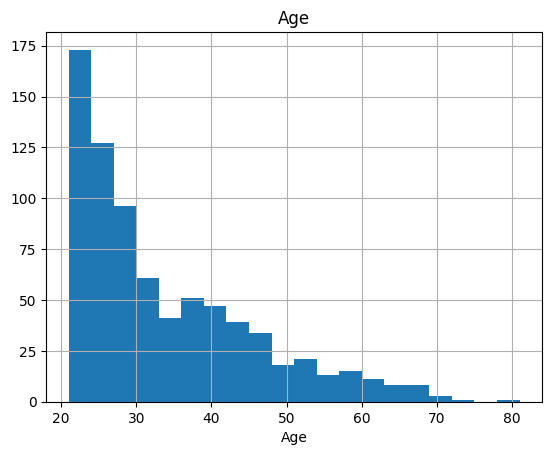

In [8]:
for col in num_cols:
  num_summary(df,col,plot=True)

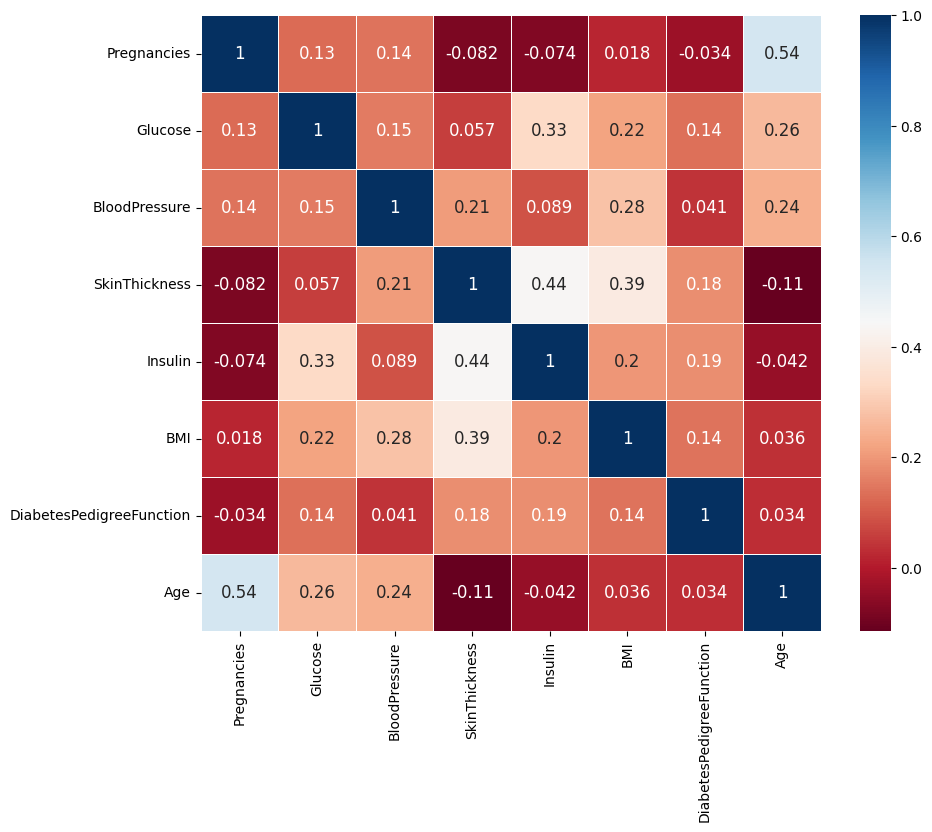

In [9]:
correlation_matrix(df,num_cols)

In [10]:
for col in num_cols:
  target_summary_with_num(df,"Outcome",col)

         Pregnancies
Outcome             
0           3.298000
1           4.865672


            Glucose
Outcome            
0        109.980000
1        141.257463


         BloodPressure
Outcome               
0            68.184000
1            70.824627


         SkinThickness
Outcome               
0            19.664000
1            22.164179


            Insulin
Outcome            
0         68.792000
1        100.335821


               BMI
Outcome           
0        30.304200
1        35.142537


         DiabetesPedigreeFunction
Outcome                          
0                        0.429734
1                        0.550500


               Age
Outcome           
0        31.190000
1        37.067164




In [11]:
################################################
# 2. Data Preprocessing & Feature Engineering
################################################

def outlier_thresholds(dataframe, col_name, q1=0.25, q3=0.75):
    quartile1 = dataframe[col_name].quantile(q1)
    quartile3 = dataframe[col_name].quantile(q3)
    interquantile_range = quartile3 - quartile1
    up_limit = quartile3 + 1.5 * interquantile_range
    low_limit = quartile1 - 1.5 * interquantile_range
    return low_limit, up_limit

def replace_with_thresholds(dataframe, variable):
    low_limit, up_limit = outlier_thresholds(dataframe, variable)
    dataframe.loc[(dataframe[variable] < low_limit), variable] = low_limit
    dataframe.loc[(dataframe[variable] > up_limit), variable] = up_limit

def check_outlier(dataframe, col_name, q1=0.25, q3=0.75):
    low_limit, up_limit = outlier_thresholds(dataframe, col_name, q1, q3)
    if dataframe[(dataframe[col_name] > up_limit) | (dataframe[col_name] < low_limit)].any(axis=None):
        return True
    else:
        return False

def one_hot_encoder(dataframe, categorical_cols, drop_first=False):
    dataframe = pd.get_dummies(dataframe, columns=categorical_cols, drop_first=drop_first)
    return dataframe

In [12]:
df.columns=[col.upper() for col in df.columns]

In [13]:
df["NEW_GLUCOSE_CAT"] =pd.cut(x=df["GLUCOSE"],bins=[-1,139,200],labels=["normal","prdiabetes"])
# 0 ile 139 arasına normal diğer kısmına diyabetli yazdık.
df.head()

,PREGNANCIES,GLUCOSE,BLOODPRESSURE,SKINTHICKNESS,INSULIN,BMI,DIABETESPEDIGREEFUNCTION,AGE,OUTCOME,NEW_GLUCOSE_CAT
0,6,148,72,35,0,33.6,0.627,50,1,prdiabetes
1,1,85,66,29,0,26.6,0.351,31,0,normal
2,8,183,64,0,0,23.3,0.672,32,1,prdiabetes
3,1,89,66,23,94,28.1,0.167,21,0,normal
4,0,137,40,35,168,43.1,2.288,33,1,normal


In [14]:
# Age
df. loc[(df['AGE'] < 35), "NEW_AGE_CAT"] = 'young'
df. loc[(df['AGE'] >= 35) & (df['AGE'] <= 55), "NEW_AGE_CAT"] = 'middleage'
df. loc[(df['AGE'] > 55), "NEW_AGE_CAT"] = 'old'
df.head()

,PREGNANCIES,GLUCOSE,BLOODPRESSURE,SKINTHICKNESS,INSULIN,BMI,DIABETESPEDIGREEFUNCTION,AGE,OUTCOME,NEW_GLUCOSE_CAT,NEW_AGE_CAT
0,6,148,72,35,0,33.6,0.627,50,1,prdiabetes,middleage
1,1,85,66,29,0,26.6,0.351,31,0,normal,young
2,8,183,64,0,0,23.3,0.672,32,1,prdiabetes,young
3,1,89,66,23,94,28.1,0.167,21,0,normal,young
4,0,137,40,35,168,43.1,2.288,33,1,normal,young


In [15]:
#BMI
df['NEW_BMI_RANGE'] = pd.cut(x=df['BMI'], bins=[-1, 18.5, 24.9, 29.9, 180],
                             labels=["underweight", "healty", "overweight", "obese"])
df.head(3)

,PREGNANCIES,GLUCOSE,BLOODPRESSURE,SKINTHICKNESS,INSULIN,BMI,DIABETESPEDIGREEFUNCTION,AGE,OUTCOME,NEW_GLUCOSE_CAT,NEW_AGE_CAT,NEW_BMI_RANGE
0,6,148,72,35,0,33.6,0.627,50,1,prdiabetes,middleage,obese
1,1,85,66,29,0,26.6,0.351,31,0,normal,young,overweight
2,8,183,64,0,0,23.3,0.672,32,1,prdiabetes,young,healty


In [16]:
check_df(df)

##################### Shape #####################
(768, 12)
##################### Types #####################
PREGNANCIES                    int64
GLUCOSE                        int64
BLOODPRESSURE                  int64
SKINTHICKNESS                  int64
INSULIN                        int64
BMI                          float64
DIABETESPEDIGREEFUNCTION     float64
AGE                            int64
OUTCOME                        int64
NEW_GLUCOSE_CAT             category
NEW_AGE_CAT                   object
NEW_BMI_RANGE               category
dtype: object
##################### Head #####################
   PREGNANCIES  GLUCOSE  BLOODPRESSURE  SKINTHICKNESS  INSULIN   BMI  DIABETESPEDIGREEFUNCTION  AGE  OUTCOME NEW_GLUCOSE_CAT NEW_AGE_CAT NEW_BMI_RANGE
0            6      148             72             35        0  33.6                     0.627   50        1      prdiabetes   middleage         obese
1            1       85             66             29        0  26.6             

<ipython-input-4-94ccdd2c3326>:13: FutureWarning: The default value of numeric_only in DataFrame.quantile is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  print(dataframe.quantile([0, 0.05, 0.50, 0.95, 0.99, 1]).T)


In [17]:
cat_cols, nun_cols, cat_but_car = grab_col_names(df, cat_th=5, car_th=20)
print(f"""
*cat_cols* : {cat_cols}
*nun_cols* : {nun_cols}
*cat_but_car* : {cat_but_car}
      """)


*cat_cols* : ['NEW_AGE_CAT', 'OUTCOME', 'NEW_GLUCOSE_CAT', 'NEW_BMI_RANGE']
*nun_cols* : ['PREGNANCIES', 'GLUCOSE', 'BLOODPRESSURE', 'SKINTHICKNESS', 'INSULIN', 'BMI', 'DIABETESPEDIGREEFUNCTION', 'AGE']
*cat_but_car* : []
      


In [18]:
for col in cat_cols:
  cat_summary(df, col)

           NEW_AGE_CAT      Ratio
young              488  63.541667
middleage          230  29.947917
old                 50   6.510417
##########################################
   OUTCOME      Ratio
0      500  65.104167
1      268  34.895833
##########################################
            NEW_GLUCOSE_CAT      Ratio
normal                  571  74.348958
prdiabetes              197  25.651042
##########################################
             NEW_BMI_RANGE      Ratio
obese                  472  61.458333
overweight             179  23.307292
healty                 102  13.281250
underweight             15   1.953125
##########################################


In [19]:
for col in cat_cols:
  target_summary_with_cat(df, "OUTCOME", col)

             TARGET_MEAN
NEW_AGE_CAT             
middleage       0.543478
old             0.340000
young           0.258197


         TARGET_MEAN
OUTCOME             
0                0.0
1                1.0


                 TARGET_MEAN
NEW_GLUCOSE_CAT             
normal              0.232925
prdiabetes          0.685279


               TARGET_MEAN
NEW_BMI_RANGE             
underweight       0.133333
healty            0.068627
overweight        0.223464
obese             0.463983




In [20]:
for col in cat_cols:
  target_summary_with_cat(df,"OUTCOME",col)

             TARGET_MEAN
NEW_AGE_CAT             
middleage       0.543478
old             0.340000
young           0.258197


         TARGET_MEAN
OUTCOME             
0                0.0
1                1.0


                 TARGET_MEAN
NEW_GLUCOSE_CAT             
normal              0.232925
prdiabetes          0.685279


               TARGET_MEAN
NEW_BMI_RANGE             
underweight       0.133333
healty            0.068627
overweight        0.223464
obese             0.463983




In [21]:
cat_cols = [col for col in cat_cols if "OUTCOME" not in col]

In [22]:
df=one_hot_encoder(df,cat_cols,drop_first=True)
df.head()

,PREGNANCIES,GLUCOSE,BLOODPRESSURE,SKINTHICKNESS,INSULIN,BMI,DIABETESPEDIGREEFUNCTION,AGE,OUTCOME,NEW_AGE_CAT_old,NEW_AGE_CAT_young,NEW_GLUCOSE_CAT_prdiabetes,NEW_BMI_RANGE_healty,NEW_BMI_RANGE_overweight,NEW_BMI_RANGE_obese
0,6,148,72,35,0,33.6,0.627,50,1,0,0,1,0,0,1
1,1,85,66,29,0,26.6,0.351,31,0,0,1,0,0,1,0
2,8,183,64,0,0,23.3,0.672,32,1,0,1,1,1,0,0
3,1,89,66,23,94,28.1,0.167,21,0,0,1,0,0,1,0
4,0,137,40,35,168,43.1,2.288,33,1,0,1,0,0,0,1


In [23]:
check_df(df)

##################### Shape #####################
(768, 15)
##################### Types #####################
PREGNANCIES                     int64
GLUCOSE                         int64
BLOODPRESSURE                   int64
SKINTHICKNESS                   int64
INSULIN                         int64
BMI                           float64
DIABETESPEDIGREEFUNCTION      float64
AGE                             int64
OUTCOME                         int64
NEW_AGE_CAT_old                 uint8
NEW_AGE_CAT_young               uint8
NEW_GLUCOSE_CAT_prdiabetes      uint8
NEW_BMI_RANGE_healty            uint8
NEW_BMI_RANGE_overweight        uint8
NEW_BMI_RANGE_obese             uint8
dtype: object
##################### Head #####################
   PREGNANCIES  GLUCOSE  BLOODPRESSURE  SKINTHICKNESS  INSULIN   BMI  DIABETESPEDIGREEFUNCTION  AGE  OUTCOME  NEW_AGE_CAT_old  NEW_AGE_CAT_young  NEW_GLUCOSE_CAT_prdiabetes  NEW_BMI_RANGE_healty  NEW_BMI_RANGE_overweight  NEW_BMI_RANGE_obese
0            6 

In [24]:
df.columns=[col.upper() for col in df.columns]

In [25]:
#son güncel degisken turlerini tutuyorum.
cat_cols,num_cols,cat_but_car=grab_col_names(df,cat_th=5,car_th=5)
print(f"""
*cat_cols* : {cat_cols}
*nun_cols* : {nun_cols}
*cat_but_car* : {cat_but_car}
      """)


*cat_cols* : ['OUTCOME', 'NEW_AGE_CAT_OLD', 'NEW_AGE_CAT_YOUNG', 'NEW_GLUCOSE_CAT_PRDIABETES', 'NEW_BMI_RANGE_HEALTY', 'NEW_BMI_RANGE_OVERWEIGHT', 'NEW_BMI_RANGE_OBESE']
*nun_cols* : ['PREGNANCIES', 'GLUCOSE', 'BLOODPRESSURE', 'SKINTHICKNESS', 'INSULIN', 'BMI', 'DIABETESPEDIGREEFUNCTION', 'AGE']
*cat_but_car* : []
      


In [26]:
for col in num_cols:
  print(col,check_outlier(df,col,0.05,0.95))#iqr çok değişkenli etkiyi ksçırsbilir.o yüzden 0.25 e 0.75 yapmadık.

PREGNANCIES False
GLUCOSE False
BLOODPRESSURE False
SKINTHICKNESS False
INSULIN True
BMI False
DIABETESPEDIGREEFUNCTION False
AGE False


In [27]:
replace_with_thresholds(df,"INSULIN")

In [28]:
df[num_cols].columns

Index(['PREGNANCIES', 'GLUCOSE', 'BLOODPRESSURE', 'SKINTHICKNESS', 'INSULIN', 'BMI', 'DIABETESPEDIGREEFUNCTION', 'AGE'], dtype='object')

In [29]:
#Standartlaştırma
X_scaled=StandardScaler().fit_transform(df[num_cols])
df[num_cols]=pd.DataFrame(X_scaled,columns=df[num_cols].columns)

In [30]:
y=df["OUTCOME"]
X=df.drop("OUTCOME",axis=1)

In [31]:
check_df(X)

##################### Shape #####################
(768, 14)
##################### Types #####################
PREGNANCIES                   float64
GLUCOSE                       float64
BLOODPRESSURE                 float64
SKINTHICKNESS                 float64
INSULIN                       float64
BMI                           float64
DIABETESPEDIGREEFUNCTION      float64
AGE                           float64
NEW_AGE_CAT_OLD                 uint8
NEW_AGE_CAT_YOUNG               uint8
NEW_GLUCOSE_CAT_PRDIABETES      uint8
NEW_BMI_RANGE_HEALTY            uint8
NEW_BMI_RANGE_OVERWEIGHT        uint8
NEW_BMI_RANGE_OBESE             uint8
dtype: object
##################### Head #####################
   PREGNANCIES   GLUCOSE  BLOODPRESSURE  SKINTHICKNESS   INSULIN       BMI  DIABETESPEDIGREEFUNCTION       AGE  NEW_AGE_CAT_OLD  NEW_AGE_CAT_YOUNG  NEW_GLUCOSE_CAT_PRDIABETES  NEW_BMI_RANGE_HEALTY  NEW_BMI_RANGE_OVERWEIGHT  NEW_BMI_RANGE_OBESE
0     0.639947  0.848324       0.149641       0.907

In [32]:
def diabetes_data_prep(dataframe):
    dataframe.columns = [col.upper() for col in dataframe.columns]

    # Glucose
    dataframe['NEW_GLUCOSE_CAT'] = pd.cut(x=dataframe['GLUCOSE'], bins=[-1, 139, 200], labels=["normal", "prediabetes"])

    # Age
    dataframe.loc[(dataframe['AGE'] < 35), "NEW_AGE_CAT"] = 'young'
    dataframe.loc[(dataframe['AGE'] >= 35) & (dataframe['AGE'] <= 55), "NEW_AGE_CAT"] = 'middleage'
    dataframe.loc[(dataframe['AGE'] > 55), "NEW_AGE_CAT"] = 'old'

    # BMI
    dataframe['NEW_BMI_RANGE'] = pd.cut(x=dataframe['BMI'], bins=[-1, 18.5, 24.9, 29.9, 100],
                                        labels=["underweight", "healty", "overweight", "obese"])

    # BloodPressure
    dataframe['NEW_BLOODPRESSURE'] = pd.cut(x=dataframe['BLOODPRESSURE'], bins=[-1, 79, 89, 123],
                                            labels=["normal", "hs1", "hs2"])

    cat_cols, num_cols, cat_but_car = grab_col_names(dataframe, cat_th=5, car_th=20)

    cat_cols = [col for col in cat_cols if "OUTCOME" not in col]

    df = one_hot_encoder(dataframe, cat_cols, drop_first=True)

    df.columns = [col.upper() for col in df.columns]

    cat_cols, num_cols, cat_but_car = grab_col_names(df, cat_th=5, car_th=20)

    cat_cols = [col for col in cat_cols if "OUTCOME" not in col]

    replace_with_thresholds(df, "INSULIN")

    X_scaled = StandardScaler().fit_transform(df[num_cols])
    df[num_cols] = pd.DataFrame(X_scaled, columns=df[num_cols].columns)

    y = df["OUTCOME"]
    X = df.drop(["OUTCOME"], axis=1)

    return X, y

In [33]:
df=pd.read_csv("diabetes.csv")
X,y=diabetes_data_prep(df)

In [34]:
check_df(X)

##################### Shape #####################
(768, 16)
##################### Types #####################
PREGNANCIES                    float64
GLUCOSE                        float64
BLOODPRESSURE                  float64
SKINTHICKNESS                  float64
INSULIN                        float64
BMI                            float64
DIABETESPEDIGREEFUNCTION       float64
AGE                            float64
NEW_AGE_CAT_OLD                  uint8
NEW_AGE_CAT_YOUNG                uint8
NEW_GLUCOSE_CAT_PREDIABETES      uint8
NEW_BMI_RANGE_HEALTY             uint8
NEW_BMI_RANGE_OVERWEIGHT         uint8
NEW_BMI_RANGE_OBESE              uint8
NEW_BLOODPRESSURE_HS1            uint8
NEW_BLOODPRESSURE_HS2            uint8
dtype: object
##################### Head #####################
   PREGNANCIES   GLUCOSE  BLOODPRESSURE  SKINTHICKNESS   INSULIN       BMI  DIABETESPEDIGREEFUNCTION       AGE  NEW_AGE_CAT_OLD  NEW_AGE_CAT_YOUNG  NEW_GLUCOSE_CAT_PREDIABETES  NEW_BMI_RANGE_HEALTY  NEW_

In [44]:
######################################################
# 3. Base Models
######################################################
def base_models(X, y, scoring="roc_auc"):
    print("Base Models....")
    classifiers = [('LR', LogisticRegression()),
                   ('KNN', KNeighborsClassifier()),
                   ("SVC", SVC()),
                   ("CART", DecisionTreeClassifier()),
                   ("RF", RandomForestClassifier()),
                   ('Adaboost', AdaBoostClassifier()),
                   ('GBM', GradientBoostingClassifier()),
                   ('XGBoost', XGBClassifier(use_label_encoder=False, eval_metric='logloss')),
                   ('LightGBM', LGBMClassifier()),
                   # ('CatBoost', CatBoostClassifier(verbose=False))
    ]


    for name, classifier in classifiers:
        cv_results = cross_validate(classifier, X, y, cv=3, scoring=scoring)
        print(f"{scoring}: {round(cv_results['test_score'].mean(), 4)} ({name}) ")

In [45]:
from xgboost import XGBClassifier
base_models(X, y, scoring="accuracy")

Base Models....
accuracy: 0.7604 (LR) 
accuracy: 0.7617 (KNN) 
accuracy: 0.7656 (SVC) 
accuracy: 0.6862 (CART) 
accuracy: 0.7695 (RF) 
accuracy: 0.7578 (Adaboost) 
accuracy: 0.7526 (GBM) 
accuracy: 0.7526 (XGBoost) 
[LightGBM] [Info] Number of positive: 178, number of negative: 334
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000112 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 610
[LightGBM] [Info] Number of data points in the train set: 512, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.347656 -> initscore=-0.629357
[LightGBM] [Info] Start training from score -0.629357
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGB

In [46]:
######################################################
# 4. Automated Hyperparameter Optimization
######################################################

knn_params = {"n_neighbors": range(2, 50)}

cart_params = {'max_depth': range(1, 20),
               "min_samples_split": range(2, 30)}

rf_params = {"max_depth": [8, 15, None],
             "max_features": [5, 7, "auto"],
             "min_samples_split": [15, 20],
             "n_estimators": [200, 300]}

xgboost_params = {"learning_rate": [0.1, 0.01],
                  "max_depth": [5, 8],
                  "n_estimators": [100, 200]}

lightgbm_params = {"learning_rate": [0.01, 0.1],
                   "n_estimators": [300, 500]}

In [47]:
classifiers = [('KNN', KNeighborsClassifier(), knn_params),
               ("CART", DecisionTreeClassifier(), cart_params),
               ("RF", RandomForestClassifier(), rf_params),
               ('XGBoost', XGBClassifier(use_label_encoder=False, eval_metric='logloss'), xgboost_params),
               ('LightGBM', LGBMClassifier(), lightgbm_params)]

In [48]:
def hyperparameter_optimization(X, y, cv=3, scoring="roc_auc"):
    print("Hyperparameter Optimization....")
    best_models = {}
    for name, classifier, params in classifiers:
        print(f"########## {name} ##########")
        cv_results = cross_validate(classifier, X, y, cv=cv, scoring=scoring)
        print(f"{scoring} (Before): {round(cv_results['test_score'].mean(), 4)}")

        gs_best = GridSearchCV(classifier, params, cv=cv, n_jobs=-1, verbose=False).fit(X, y)
        final_model = classifier.set_params(**gs_best.best_params_)

        cv_results = cross_validate(final_model, X, y, cv=cv, scoring=scoring)
        print(f"{scoring} (After): {round(cv_results['test_score'].mean(), 4)}")
        print(f"{name} best params: {gs_best.best_params_}", end="\n\n")
        best_models[name] = final_model
    return best_models

best_models = hyperparameter_optimization(X, y)

Hyperparameter Optimization....
########## KNN ##########
roc_auc (Before): 0.791
roc_auc (After): 0.8211
KNN best params: {'n_neighbors': 20}

########## CART ##########
roc_auc (Before): 0.6654
roc_auc (After): 0.7943
CART best params: {'max_depth': 6, 'min_samples_split': 23}

########## RF ##########
roc_auc (Before): 0.8297


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

roc_auc (After): 0.8337
RF best params: {'max_depth': None, 'max_features': 'auto', 'min_samples_split': 15, 'n_estimators': 200}

########## XGBoost ##########
roc_auc (Before): 0.8008
roc_auc (After): 0.8147
XGBoost best params: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}

########## LightGBM ##########
[LightGBM] [Info] Number of positive: 178, number of negative: 334
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000210 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 610
[LightGBM] [Info] Number of data points in the train set: 512, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.347656 -> initscore=-0.629357
[LightGBM] [Info] Start training from score -0.629357
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

In [49]:
######################################################
# 5. Stacking & Ensemble Learning
######################################################

def voting_classifier(best_models, X, y):
    print("Voting Classifier...")

    voting_clf = VotingClassifier(estimators=[('KNN', best_models["KNN"]),
                                              ('RF', best_models["RF"]),
                                              ('LightGBM', best_models["LightGBM"])],
                                  voting='soft').fit(X, y)

    cv_results = cross_validate(voting_clf, X, y, cv=3, scoring=["accuracy", "f1", "roc_auc"])
    print(f"Accuracy: {cv_results['test_accuracy'].mean()}")
    print(f"F1Score: {cv_results['test_f1'].mean()}")
    print(f"ROC_AUC: {cv_results['test_roc_auc'].mean()}")
    return voting_clf

voting_clf = voting_classifier(best_models, X, y)

Voting Classifier...


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[LightGBM] [Info] Number of positive: 268, number of negative: 500
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000159 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 774
[LightGBM] [Info] Number of data points in the train set: 768, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.348958 -> initscore=-0.623621
[LightGBM] [Info] Start training from score -0.623621
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[LightGBM] [Info] Number of positive: 178, number of negative: 334
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000100 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 610
[LightGBM] [Info] Number of data points in the train set: 512, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.347656 -> initscore=-0.629357
[LightGBM] [Info] Start training from score -0.629357
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[LightGBM] [Info] Number of positive: 179, number of negative: 333
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000112 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 608
[LightGBM] [Info] Number of data points in the train set: 512, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.349609 -> initscore=-0.620757
[LightGBM] [Info] Start training from score -0.620757
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[LightGBM] [Info] Number of positive: 179, number of negative: 333
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000125 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 614
[LightGBM] [Info] Number of data points in the train set: 512, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.349609 -> initscore=-0.620757
[LightGBM] [Info] Start training from score -0.620757
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

In [50]:
######################################################
# 6. Prediction for a New Observation
######################################################

X.columns
random_user = X.sample(1, random_state=45)
voting_clf.predict(random_user)

joblib.dump(voting_clf, "voting_clf2.pkl")

new_model = joblib.load("voting_clf2.pkl")
new_model.predict(random_user)

array([1])

# Pipeline

In [52]:
################################################
# End-to-End Diabetes Machine Learning Pipeline II
################################################

import joblib
import pandas as pd
from lightgbm import LGBMClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, VotingClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_validate, GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier

################################################
# Helper Functions
################################################

# utils.py
# helpers.py

# Data Preprocessing & Feature Engineering
def grab_col_names(dataframe, cat_th=10, car_th=20):
    """

    Veri setindeki kategorik, numerik ve kategorik fakat kardinal değişkenlerin isimlerini verir.
    Not: Kategorik değişkenlerin içerisine numerik görünümlü kategorik değişkenler de dahildir.

    Parameters
    ------
        dataframe: dataframe
                Değişken isimleri alınmak istenilen dataframe
        cat_th: int, optional
                numerik fakat kategorik olan değişkenler için sınıf eşik değeri
        car_th: int, optinal
                kategorik fakat kardinal değişkenler için sınıf eşik değeri

    Returns
    ------
        cat_cols: list
                Kategorik değişken listesi
        num_cols: list
                Numerik değişken listesi
        cat_but_car: list
                Kategorik görünümlü kardinal değişken listesi

    Examples
    ------
        import seaborn as sns
        df = sns.load_dataset("iris")
        print(grab_col_names(df))


    Notes
    ------
        cat_cols + num_cols + cat_but_car = toplam değişken sayısı
        num_but_cat cat_cols'un içerisinde.
        Return olan 3 liste toplamı toplam değişken sayısına eşittir: cat_cols + num_cols + cat_but_car = değişken sayısı

    """

    # cat_cols, cat_but_car
    cat_cols = [col for col in dataframe.columns if dataframe[col].dtypes == "O"]
    num_but_cat = [col for col in dataframe.columns if dataframe[col].nunique() < cat_th and
                   dataframe[col].dtypes != "O"]
    cat_but_car = [col for col in dataframe.columns if dataframe[col].nunique() > car_th and
                   dataframe[col].dtypes == "O"]
    cat_cols = cat_cols + num_but_cat
    cat_cols = [col for col in cat_cols if col not in cat_but_car]

    # num_cols
    num_cols = [col for col in dataframe.columns if dataframe[col].dtypes != "O"]
    num_cols = [col for col in num_cols if col not in num_but_cat]

    # print(f"Observations: {dataframe.shape[0]}")
    # print(f"Variables: {dataframe.shape[1]}")
    # print(f'cat_cols: {len(cat_cols)}')
    # print(f'num_cols: {len(num_cols)}')
    # print(f'cat_but_car: {len(cat_but_car)}')
    # print(f'num_but_cat: {len(num_but_cat)}')
    return cat_cols, num_cols, cat_but_car

def outlier_thresholds(dataframe, col_name, q1=0.25, q3=0.75):
    quartile1 = dataframe[col_name].quantile(q1)
    quartile3 = dataframe[col_name].quantile(q3)
    interquantile_range = quartile3 - quartile1
    up_limit = quartile3 + 1.5 * interquantile_range
    low_limit = quartile1 - 1.5 * interquantile_range
    return low_limit, up_limit

def replace_with_thresholds(dataframe, variable):
    low_limit, up_limit = outlier_thresholds(dataframe, variable)
    dataframe.loc[(dataframe[variable] < low_limit), variable] = low_limit
    dataframe.loc[(dataframe[variable] > up_limit), variable] = up_limit

def one_hot_encoder(dataframe, categorical_cols, drop_first=False):
    dataframe = pd.get_dummies(dataframe, columns=categorical_cols, drop_first=drop_first)
    return dataframe

def diabetes_data_prep(dataframe):
    dataframe.columns = [col.upper() for col in dataframe.columns]

    # Glucose
    dataframe['NEW_GLUCOSE_CAT'] = pd.cut(x=dataframe['GLUCOSE'], bins=[-1, 139, 200], labels=["normal", "prediabetes"])

    # Age
    dataframe.loc[(dataframe['AGE'] < 35), "NEW_AGE_CAT"] = 'young'
    dataframe.loc[(dataframe['AGE'] >= 35) & (dataframe['AGE'] <= 55), "NEW_AGE_CAT"] = 'middleage'
    dataframe.loc[(dataframe['AGE'] > 55), "NEW_AGE_CAT"] = 'old'

    # BMI
    dataframe['NEW_BMI_RANGE'] = pd.cut(x=dataframe['BMI'], bins=[-1, 18.5, 24.9, 29.9, 100],
                                        labels=["underweight", "healty", "overweight", "obese"])

    # BloodPressure
    dataframe['NEW_BLOODPRESSURE'] = pd.cut(x=dataframe['BLOODPRESSURE'], bins=[-1, 79, 89, 123],
                                            labels=["normal", "hs1", "hs2"])

    cat_cols, num_cols, cat_but_car = grab_col_names(dataframe, cat_th=5, car_th=20)

    cat_cols = [col for col in cat_cols if "OUTCOME" not in col]

    df = one_hot_encoder(dataframe, cat_cols, drop_first=True)

    cat_cols, num_cols, cat_but_car = grab_col_names(df, cat_th=5, car_th=20)

    replace_with_thresholds(df, "INSULIN")

    X_scaled = StandardScaler().fit_transform(df[num_cols])
    df[num_cols] = pd.DataFrame(X_scaled, columns=df[num_cols].columns)

    y = df["OUTCOME"]
    X = df.drop(["OUTCOME"], axis=1)

    return X, y

# Base Models
def base_models(X, y, scoring="roc_auc"):
    print("Base Models....")
    classifiers = [('LR', LogisticRegression()),
                   ('KNN', KNeighborsClassifier()),
                   ("SVC", SVC()),
                   ("CART", DecisionTreeClassifier()),
                   ("RF", RandomForestClassifier()),
                   ('Adaboost', AdaBoostClassifier()),
                   ('GBM', GradientBoostingClassifier()),
                   ('XGBoost', XGBClassifier(use_label_encoder=False, eval_metric='logloss')),
                   ('LightGBM', LGBMClassifier()),
                   # ('CatBoost', CatBoostClassifier(verbose=False))
                   ]

    for name, classifier in classifiers:
        cv_results = cross_validate(classifier, X, y, cv=3, scoring=scoring)
        print(f"{scoring}: {round(cv_results['test_score'].mean(), 4)} ({name}) ")

# Hyperparameter Optimization

# config.py

knn_params = {"n_neighbors": range(2, 50)}

cart_params = {'max_depth': range(1, 20),
               "min_samples_split": range(2, 30)}

rf_params = {"max_depth": [8, 15, None],
             "max_features": [5, 7, "auto"],
             "min_samples_split": [15, 20],
             "n_estimators": [200, 300]}

xgboost_params = {"learning_rate": [0.1, 0.01],
                  "max_depth": [5, 8],
                  "n_estimators": [100, 200],
                  "colsample_bytree": [0.5, 1]}

lightgbm_params = {"learning_rate": [0.01, 0.1],
                   "n_estimators": [300, 500],
                   "colsample_bytree": [0.7, 1]}

classifiers = [('KNN', KNeighborsClassifier(), knn_params),
               ("CART", DecisionTreeClassifier(), cart_params),
               ("RF", RandomForestClassifier(), rf_params),
               ('XGBoost', XGBClassifier(use_label_encoder=False, eval_metric='logloss'), xgboost_params),
               ('LightGBM', LGBMClassifier(), lightgbm_params)]

def hyperparameter_optimization(X, y, cv=3, scoring="roc_auc"):
    print("Hyperparameter Optimization....")
    best_models = {}
    for name, classifier, params in classifiers:
        print(f"########## {name} ##########")
        cv_results = cross_validate(classifier, X, y, cv=cv, scoring=scoring)
        print(f"{scoring} (Before): {round(cv_results['test_score'].mean(), 4)}")

        gs_best = GridSearchCV(classifier, params, cv=cv, n_jobs=-1, verbose=False).fit(X, y)
        final_model = classifier.set_params(**gs_best.best_params_)

        cv_results = cross_validate(final_model, X, y, cv=cv, scoring=scoring)
        print(f"{scoring} (After): {round(cv_results['test_score'].mean(), 4)}")
        print(f"{name} best params: {gs_best.best_params_}", end="\n\n")
        best_models[name] = final_model
    return best_models

# Stacking & Ensemble Learning
def voting_classifier(best_models, X, y):
    print("Voting Classifier...")
    voting_clf = VotingClassifier(estimators=[('KNN', best_models["KNN"]), ('RF', best_models["RF"]),
                                              ('LightGBM', best_models["LightGBM"])],
                                  voting='soft').fit(X, y)
    cv_results = cross_validate(voting_clf, X, y, cv=3, scoring=["accuracy", "f1", "roc_auc"])
    print(f"Accuracy: {cv_results['test_accuracy'].mean()}")
    print(f"F1Score: {cv_results['test_f1'].mean()}")
    print(f"ROC_AUC: {cv_results['test_roc_auc'].mean()}")
    return voting_clf



################################################
# Pipeline Main Function
################################################

def main():
    df = pd.read_csv("diabetes.csv")
    X, y = diabetes_data_prep(df)
    base_models(X, y)
    best_models = hyperparameter_optimization(X, y)
    voting_clf = voting_classifier(best_models, X, y)
    joblib.dump(voting_clf, "voting_clf.pkl")
    return voting_clf

if __name__ == "__main__":
    print("İşlem başladı")
    main()

# git github
# makefile
# veri tabanlarından
# log
# class
# docker
# requirement.txt

İşlem başladı
Base Models....
roc_auc: 0.8409 (LR) 
roc_auc: 0.791 (KNN) 
roc_auc: 0.8355 (SVC) 
roc_auc: 0.6523 (CART) 
roc_auc: 0.8245 (RF) 
roc_auc: 0.8196 (Adaboost) 
roc_auc: 0.8259 (GBM) 
roc_auc: 0.8008 (XGBoost) 
[LightGBM] [Info] Number of positive: 178, number of negative: 334
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000122 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 610
[LightGBM] [Info] Number of data points in the train set: 512, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.347656 -> initscore=-0.629357
[LightGBM] [Info] Start training from score -0.629357
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

roc_auc (After): 0.8376
RF best params: {'max_depth': None, 'max_features': 'auto', 'min_samples_split': 15, 'n_estimators': 300}

########## XGBoost ##########
roc_auc (Before): 0.8008
roc_auc (After): 0.8268
XGBoost best params: {'colsample_bytree': 0.5, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}

########## LightGBM ##########
[LightGBM] [Info] Number of positive: 178, number of negative: 334
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000215 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 610
[LightGBM] [Info] Number of data points in the train set: 512, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.347656 -> initscore=-0.629357
[LightGBM] [Info] Start training from score -0.629357
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[LightGBM] [Info] Number of positive: 268, number of negative: 500
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000138 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 774
[LightGBM] [Info] Number of data points in the train set: 768, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.348958 -> initscore=-0.623621
[LightGBM] [Info] Start training from score -0.623621
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[LightGBM] [Info] Number of positive: 178, number of negative: 334
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000108 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 610
[LightGBM] [Info] Number of data points in the train set: 512, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.347656 -> initscore=-0.629357
[LightGBM] [Info] Start training from score -0.629357
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[LightGBM] [Info] Number of positive: 179, number of negative: 333
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000118 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 608
[LightGBM] [Info] Number of data points in the train set: 512, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.349609 -> initscore=-0.620757
[LightGBM] [Info] Start training from score -0.620757
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[LightGBM] [Info] Number of positive: 179, number of negative: 333
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000117 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 614
[LightGBM] [Info] Number of data points in the train set: 512, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.349609 -> initscore=-0.620757
[LightGBM] [Info] Start training from score -0.620757
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

# Prediction

In [56]:
################################################
# End-to-End Diabetes Machine Learning Pipeline III
################################################
import joblib
import pandas as pd

random_user = df.sample(1, random_state=45)

new_model = joblib.load("voting_clf.pkl")

#new_model.predict(random_user)

#from diabetes_pipeline import diabetes_data_prep --> for spyder,pycharm ...

X, y = diabetes_data_prep(df)

random_user = X.sample(1, random_state=50)

new_model = joblib.load("voting_clf.pkl")

new_model.predict(random_user)

array([0])